In [29]:
%matplotlib inline

from HeaderP import *
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
plt.rcParams.keys()
plt.rc('font', family='serif')
params = {
   'axes.labelsize': 30,
   'axes.linewidth': 1.5,
   'legend.fontsize': 25,
   'legend.frameon': False,
   'lines.linewidth': 2,
   'xtick.direction': 'in',
   'xtick.labelsize': 25,
   'xtick.major.bottom': True,
   'xtick.major.pad': 10,
   'xtick.major.size': 10,
   'xtick.major.width': 1,
   'xtick.minor.bottom': True,
   'xtick.minor.pad': 3.5,
   'xtick.minor.size': 5,
   'xtick.minor.top': True,
   'xtick.minor.visible': True,
   'xtick.minor.width': 1,
   'xtick.top': True,
   'ytick.direction': 'in',
   'ytick.labelsize': 25,
   'ytick.major.pad': 10,
   'ytick.major.size': 10,
   'ytick.major.width': 1,
   'ytick.minor.pad': 3.5,
   'ytick.minor.size': 5,
   'ytick.minor.visible': True,
   'ytick.minor.width': 1,
   'ytick.right': True,
   'figure.figsize': [10,10], # instead of 4.5, 4.5
   'savefig.format': 'eps',
   }
plt.rcParams.update(params)

def fitpoints(x,y):
    z = np.polyfit(x,y,1)
    p = np.poly1d(z)
    return p


from tqdm import trange
import math
def movingMed_time(x,y,x_window,delta_x_window):
    # medians output
    x_med=np.zeros(len(x))
    y_med=np.zeros(len(y))

    # define the boundaries of the windows
    if len(x)==0:
        return x_med,y_med
    window_min=float(min(x))
    window_max=float(window_min+delta_x_window)
    
    # max time
    maxtime=max(x)
    
    # break when time window hits the end
    while window_max<=maxtime+x_window:
        seldf=(x>=window_min) & (x<=window_max) # get points between the window
        
        x_med[seldf]=np.median(x[seldf]) # all values for these indices are subsituded with median time
        y_med[seldf]=np.median(y[seldf]) # all values for these indices are subsituded with median flux
        
        # slide the window
        window_min=window_min+delta_x_window
        window_max=window_max+delta_x_window
    return x_med, y_med

def calcmidval(x_med,y_med,x_val):
    sort_x_med,sort_y_med=zip(*sorted(zip(x_med,y_med)))
    sort_x_med=np.asarray(sort_x_med)
    sort_y_med=np.asarray(sort_y_med)
    if x_val in sort_x_med:
        m=(sort_x_med==x_val)
        #print(sort_y_med[m])
        return sort_y_med[m][0]
    else:
        for i in range(len(sort_x_med)):
            if sort_x_med[i]>x_val:
                if i==0:
                    return sort_y_med[0]
                else:
                    p=fitpoints([sort_x_med[i-1],sort_x_med[i]],[sort_y_med[i-1],sort_y_med[i]])
                    return p(x_val)
            return(sort_y_med[-1])
        
def calc_measure_disp(df,name,method='movingmedian',p=0):
    trytime=100
    agedisp=[]
    
    x,xerr=df['Age'].values,df['Age_err'].values
    y,yerr=df[name].values,df[name+'_ERR'].values
    
    if method=='movingmedian':
        for i in trange(trytime):
            df['newage']=np.array([np.random.normal(x[k], xerr[k],1)[0] for k in range(len(x))])
            df['newabun']=np.array([np.random.normal(y[k], yerr[k],1)[0] for k in range(len(y))])
            df['newmed']=np.array([calcmidval(df['med_age'],df['med_abun'],i) for i in df['newage']])
        
            agedisp.append(np.mean((df['newabun']-df['newmed'])**2.))
            
    elif method=='linear':
        for i in trange(trytime):
            df['newage']=np.array([np.random.normal(x[k], xerr[k],1)[0] for k in range(len(x))])
            df['newabun']=np.array([np.random.normal(y[k], yerr[k],1)[0] for k in range(len(y))])
            df['newmed']=p(df['newage'])
            
            agedisp.append(np.mean((df['newabun']-df['newmed'])**2.))
            
            
    return np.std(np.array(agedisp))**2.


def calc_disp(df,name,method='movingmedian',p=0):
    df_dropna=df.dropna(subset=['med_age',name,'med_abun',name+'_ERR'])

    if method=='movingmedian':
        # calcualte total dispersion
        totdisp=np.mean((df_dropna[name]-df_dropna['med_abun'])**2.)
        #print(totdisp)
    
        # calculate measurement dispersion
        meadisp=calc_measure_disp(df,name)
        
    elif method=='linear':
        # calcualte total dispersion
        totdisp=np.mean((df_dropna[name]-p(df_dropna['Age']))**2.)
        meadisp=calc_measure_disp(df,name,'linear',p)
        
    
    #print(df['Age_err'])
    # calculate int dispersion
    intdisp=np.sqrt(totdisp-meadisp)
    #print('total',totdisp,'measured',meadisp,'intr',intdisp)
    return np.sqrt(totdisp),intdisp


from scipy.ndimage import gaussian_filter
def plotTrends(df_abun_st_ha,df_abun_st_la,figname,method='movingmedian',order=1):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}
    
    abundlim={'C_FE':[-0.25,0.25],'MG_FE':[-0.25,0.25],'AL_FE':[-0.25,0.25],'SI_FE':[-0.25,0.25],
              'S_FE':[-0.25,0.25],'CA_FE':[-0.1,0.1],'TI_FE':[-0.25,0.25],'CR_FE':[-0.1,0.1],
              'MN_FE':[-0.25,0.25],'CO_FE':[-0.25,0.25],'NI_FE':[-0.1,0.1],'CU_FE':[-0.25,0.25],
              'O_FE':[-0.25,0.25],'NA_FE':[-0.25,0.25],'K_FE':[-0.25,0.25],'V_FE':[-0.25,0.25],
              'P_FE':[-0.25,0.25],'RB_FE':[-0.25,0.25],'N_FE':[-0.5,0.5],'M_H':[-0.1,0.1]}


    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #

    Abunname=[]
    hi_dis=[]
    lo_dis=[]

    tot_hi_dis=[]
    tot_lo_dis=[]

    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.dropna(subset=['Age','Age_err',abun_apog[i],abun_apog[i]+"_ERR"])
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<10]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
        
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.dropna(subset=['Age','Age_err',abun_apog[i],abun_apog[i]+"_ERR"])
        df_plot_la=df_plot_la.loc[df_plot_la['Age']<10]
        df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        #print('errer',df_plot_ha['Age_err'])
    
        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
        #print(df_plot_ha['Age_err'])
    
        if method=='movingmedian':
            df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la[abun_apog[i]].values,
                                                                agewindow,slidwindow)
            df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha[abun_apog[i]].values,
                                                                agewindow,slidwindow)
    
            df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
            df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)
    
            df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
            df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        
        elif method=='linear':
            if len(df_plot_la)==0 or len(df_plot_ha)==0:
                continue
            z = np.polyfit(df_plot_la['Age'].values,df_plot_la[abun_apog[i]].values,order)
            p_la = np.poly1d(z)
            z = np.polyfit(df_plot_ha['Age'].values,df_plot_ha[abun_apog[i]].values,order)
            p_ha = np.poly1d(z)
            
            
            df_plot_la['med_age'],df_plot_la['med_abun']=df_plot_la['Age'],p_la(df_plot_la['Age'])
            df_plot_ha['med_age'],df_plot_ha['med_abun']=df_plot_ha['Age'],p_ha(df_plot_ha['Age'])
    
            df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
            df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        
    
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['Age'],df_plot_la[abun_apog[i]],fmt='b.',alpha=0.2,label='low-$\\alpha$')
        plt.errorbar(df_plot_ha['Age'],df_plot_ha[abun_apog[i]],fmt='r.',alpha=0.2,label='high-$\\alpha$')
    
        if len(df_plot_la['Age'])!=0:   
            print(abun_apog[i])
        
            plt.plot(df_plot_la['med_age'],df_plot_la['med_abun'],'b-',alpha=1,linewidth=2,label='low-$\\alpha$')
            plt.plot(df_plot_ha['med_age'],df_plot_ha['med_abun'],'r-',alpha=1,linewidth=2,label='high-$\\alpha$')
        
            #print(df_plot_ha['Age_err'])
            if method=='movingmedian':
                tot_la,disp_la=calc_disp(df_plot_la,abun_apog[i])
                tot_ha,disp_ha=calc_disp(df_plot_ha,abun_apog[i])
            elif method=='linear':
                tot_la,disp_la=calc_disp(df_plot_la,abun_apog[i],'linear',p_la)
                tot_ha,disp_ha=calc_disp(df_plot_ha,abun_apog[i],'linear',p_ha)
                
            #print(abun_apog[i])
            plt.title('Dispersion: low-a:%.5f, high-a:%.5f,\n diffs:%.5f'%(disp_la,disp_ha,disp_ha-disp_la),fontsize=15)
    
    
            Abunname.append(abund[abun_apog[i]]+'Fe]')
            hi_dis.append(disp_ha)
            lo_dis.append(disp_la)
            tot_hi_dis.append(tot_ha)
            tot_lo_dis.append(tot_la)
        
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
        plt.ylim(abundlim[abun_apog[i]])
    
    
    
    #plt.legend()
    
    
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
    if method=='movingmedian':
        df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['M_H'].values,
                                                                agewindow,slidwindow)
        df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['M_H'].values,
                                                                agewindow,slidwindow)
    
        df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
        df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)
    
        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        
    elif method=='linear':
        z = np.polyfit(df_plot_la['Age'].values,df_plot_la['M_H'].values,order)
        p_la = np.poly1d(z)
        z = np.polyfit(df_plot_ha['Age'].values,df_plot_ha['M_H'].values,order)
        p_ha = np.poly1d(z)
            
            
        df_plot_la['med_age'],df_plot_la['med_abun']=df_plot_la['Age'],p_la(df_plot_la['Age'])
        df_plot_ha['med_age'],df_plot_ha['med_abun']=df_plot_ha['Age'],p_ha(df_plot_ha['Age'])
    
        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
    
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['Age'],df_plot_la['M_H'],fmt='b.',alpha=0.2,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['M_H'],fmt='r.',alpha=0.2,label='high-$\\alpha$')
    
    plt.plot(df_plot_la['med_age'],df_plot_la['med_abun'],'b-',alpha=1,linewidth=2,label='low-$\\alpha$')
    plt.plot(df_plot_ha['med_age'],df_plot_ha['med_abun'],'r-',alpha=1,linewidth=2,label='high-$\\alpha$')

    if method=='movingmedian':
            tot_la,disp_la=calc_disp(df_plot_la,'M_H')
            tot_ha,disp_ha=calc_disp(df_plot_ha,'M_H')
    elif method=='linear':
            tot_la,disp_la=calc_disp(df_plot_la,'M_H','linear',p_la)
            tot_ha,disp_ha=calc_disp(df_plot_ha,'M_H','linear',p_ha)
            
    plt.title('Dispersion: low-a:%.5f, high-a:%.5f,\n diffs:%.5f'%(disp_la,disp_ha,disp_ha-disp_la),fontsize=15)

    Abunname.append('Fe')
    hi_dis.append(disp_ha)
    lo_dis.append(disp_la)
    tot_hi_dis.append(tot_ha)
    tot_lo_dis.append(tot_la)

    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    plt.ylim([-0.1,0.1])
    #plt.legend()
 
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    
    
    if method=='movingmedian':
        df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['C_N'].values,
                                                                agewindow,slidwindow)
        df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['C_N'].values,
                                                                agewindow,slidwindow)
    
        df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
        df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)
    
        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        
    elif method=='linear':
        z = np.polyfit(df_plot_la['Age'].values,df_plot_la['C_N'].values,order)
        p_la = np.poly1d(z)
        z = np.polyfit(df_plot_ha['Age'].values,df_plot_ha['C_N'].values,order)
        p_ha = np.poly1d(z)
            
            
        df_plot_la['med_age'],df_plot_la['med_abun']=df_plot_la['Age'],p_la(df_plot_la['Age'])
        df_plot_ha['med_age'],df_plot_ha['med_abun']=df_plot_ha['Age'],p_ha(df_plot_ha['Age'])
    
        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        
    
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['Age'],df_plot_la['C_N'],fmt='b.',alpha=0.2,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['C_N'],fmt='r.',alpha=0.2,label='high-$\\alpha$')
    
    plt.plot(df_plot_la['med_age'],df_plot_la['med_abun'],'b-',alpha=1,linewidth=2,label='low-$\\alpha$')
    plt.plot(df_plot_ha['med_age'],df_plot_ha['med_abun'],'r-',alpha=1,linewidth=2,label='high-$\\alpha$')

    if method=='movingmedian':
            tot_la,disp_la=calc_disp(df_plot_la,'C_N')
            tot_ha,disp_ha=calc_disp(df_plot_ha,'C_N')
    elif method=='linear':
            tot_la,disp_la=calc_disp(df_plot_la,'C_N','linear',p_la)
            tot_ha,disp_ha=calc_disp(df_plot_ha,'C_N','linear',p_ha)
  
    Abunname.append('[C/N]')
    hi_dis.append(disp_ha)
    lo_dis.append(disp_la)
    tot_hi_dis.append(tot_ha)
    tot_lo_dis.append(tot_la)

    plt.title('Dispersion: low-a:%.5f, high-a:%.5f,\n diffs:%.5f'%(disp_la,disp_ha,disp_ha-disp_la),fontsize=15)

    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    plt.ylim([-0.5,0.5])
    #plt.legend()

    plt.tight_layout()

    plt.savefig(figname+'.png')
    return hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname

def tempcheck(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}

    plt.figure(figsize=(22.5,25))
    cm = plt.cm.get_cmap('viridis',5)
    for i in range(1,len(abun_apog)):
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
    
        plt.subplot(5,4,i+1)
        plt.scatter(df_plot_la['Age'],df_plot_la[abun_apog[i]],c=df_plot_la['TEFF'],vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff)
        plt.scatter(df_plot_ha['Age'],df_plot_ha[abun_apog[i]],c=df_plot_ha['TEFF'],vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff)
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
    
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,1)
    plt.scatter(df_plot_la['Age'],df_plot_la['M_H'],c=df_plot_la['TEFF'],vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff,
            alpha=0.5,label='low-$\\alpha$')
    plt.scatter(df_plot_ha['Age'],df_plot_ha['M_H'],c=df_plot_ha['TEFF'],vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff,
            alpha=0.5,label='high-$\\alpha$')
    
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    plt.legend()
 
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,20)
    plt.scatter(df_plot_la['Age'],df_plot_la['C_FE']-df_plot_la['N_FE'],
             c=df_plot_la['TEFF'],alpha=0.5,vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff,label='low-$\\alpha$')
    plt.scatter(df_plot_ha['Age'],df_plot_ha['C_FE']-df_plot_ha['N_FE'],
             c=df_plot_ha['TEFF'],alpha=0.5,vmin=tempcut-rangeTeff,vmax=tempcut+rangeTeff,label='high-$\\alpha$')
    
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    plt.legend()


    plt.tight_layout()


    
def plotraw(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}
    
    lim=[-0.5,0.5]
    limx=[0,15]
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['Age'],df_plot_la[abun_apog[i]],yerr=df_plot_la[abun_apog[i]+'_ERR'],fmt='bo',alpha=0.5,label='low-$\\alpha$')
        plt.errorbar(df_plot_ha['Age'],df_plot_ha[abun_apog[i]],yerr=df_plot_ha[abun_apog[i]+'_ERR'],fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
        plt.ylim(lim)
        plt.xlim(limx)
        plt.legend()
    
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['Age'],df_plot_la['M_H'],fmt='bo',alpha=0.5,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['M_H'],fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    plt.legend()
    plt.ylim(lim)
    plt.xlim(limx)
 
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['Age'],df_plot_la['C_FE']-df_plot_la['N_FE'],
             fmt='bo',alpha=0.5,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['C_FE']-df_plot_ha['N_FE'],
             fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    plt.legend()
    plt.ylim(lim)
    plt.xlim(limx)


    plt.tight_layout()
    

def plotagedis(df_abun_st_ha,df_abun_st_la,agebin,start,end):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}
    
    size=int(np.ceil((end-start)/agebin))
    age_binned=[(2*j+1)*agebin/2+start for j in range(size)]

    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<10]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
        df_plot_ha=df_plot_ha.reset_index(drop=True)

        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.loc[df_plot_la['Age']<10]
        df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
        df_plot_la=df_plot_la.reset_index(drop=True)


        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])



        df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                    df_plot_la[abun_apog[i]].values,
                                                                    agewindow,slidwindow)
        df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                    df_plot_ha[abun_apog[i]].values,
                                                                    agewindow,slidwindow)

        df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
        df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)


        plt.subplot(5,4,i+1)


        if len(df_plot_la['Age'])!=0:   
            print(abun_apog[i])

            dispersions_la=[]
            dispersions_ha=[]
            dispersions_la_err=[]
            dispersions_ha_err=[]
            for j in range(size):
                agemin=j*agebin+start
                agemax=(j+1)*agebin+start

                new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
                new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

                new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
                new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


                tot_la,disp_la=calc_disp(new_df_inbin_la,abun_apog[i])
                tot_ha,disp_ha=calc_disp(new_df_inbin_ha,abun_apog[i])

                dispersions_la.append(disp_la)
                dispersions_ha.append(disp_ha)
                
                if len(new_df_inbin_la)==0:
                    range_la=0
                else:
                    range_la=max(new_df_inbin_la[abun_apog[i]])-min(new_df_inbin_la[abun_apog[i]])
                if len(new_df_inbin_ha)==0:
                    range_ha=0
                else:
                    range_ha=max(new_df_inbin_ha[abun_apog[i]])-min(new_df_inbin_ha[abun_apog[i]])
                
                dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
                dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))

            plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
            plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

        plt.ylabel(abund[abun_apog[i]]+'Fe] dispersion')
        plt.xlabel('Age bin center [Gyr]')



        #plt.legend()

    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)

    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])

    df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['M_H'].values,
                                                                agewindow,slidwindow)
    df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['M_H'].values,
                                                                agewindow,slidwindow)

    df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
    df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

    plt.subplot(5,4,1)
    dispersions_la=[]
    dispersions_ha=[]
    dispersions_la_err=[]
    dispersions_ha_err=[]
    clear_output(wait = True)
    print('FE_H')
    for j in range(size):
        agemin=j*agebin+start
        agemax=(j+1)*agebin+start

        new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
        new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

        new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
        new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


        tot_la,disp_la=calc_disp(new_df_inbin_la,'M_H')
        tot_ha,disp_ha=calc_disp(new_df_inbin_ha,'M_H')

        if len(new_df_inbin_la)==0:
            range_la=0
        else:
            range_la=max(new_df_inbin_la['M_H'])-min(new_df_inbin_la['M_H'])
        if len(new_df_inbin_ha)==0:
            range_ha=0
        else:
            range_ha=max(new_df_inbin_ha['M_H'])-min(new_df_inbin_ha['M_H'])
                    
        dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
        dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))
 
        dispersions_la.append(disp_la)
        dispersions_ha.append(disp_ha)

    plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
    plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

    plt.ylabel('Fe dispersion')
    plt.xlabel('Age bin center [Gyr]')
    #plt.legend()

    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)

    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    

    df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['C_N'].values,
                                                                agewindow,slidwindow)
    df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['C_N'].values,
                                                                agewindow,slidwindow)

    df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
    df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

    plt.subplot(5,4,20)
    dispersions_la=[]
    dispersions_ha=[]
    dispersions_la_err=[]
    dispersions_ha_err=[]
    clear_output(wait = True)
    print('C_N')
    for j in trange(size):
        agemin=j*agebin+start
        agemax=(j+1)*agebin+start

        new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
        new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

        new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
        new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


        tot_la,disp_la=calc_disp(new_df_inbin_la,'C_N')
        tot_ha,disp_ha=calc_disp(new_df_inbin_ha,'C_N')

        if len(new_df_inbin_la)==0:
            range_la=0
        else:
            range_la=max(new_df_inbin_la['C_N'])-min(new_df_inbin_la['C_N'])
        if len(new_df_inbin_ha)==0:
            range_ha=0
        else:
            range_ha=max(new_df_inbin_ha['C_N'])-min(new_df_inbin_ha['C_N'])
            
        dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
        dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))
        
        dispersions_la.append(disp_la)
        dispersions_ha.append(disp_ha)

    plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
    plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

    plt.ylabel('[C/N] dispersion')
    plt.xlabel('Age bin center [Gyr]')
    #plt.legend()

    plt.tight_layout()

# For sesmic stars

## Get high/low-$\alpha$ disk

Ages from https://ui.adsabs.harvard.edu/abs/2019yCat..22390032P/abstract

In [104]:
hdulist = fits.open('asu.fit')


In [105]:
df1 = pd.DataFrame(hdulist[1].data, dtype="float64")
df2 = pd.DataFrame(hdulist[2].data, dtype="float64")

In [106]:
df=pd.merge(df1,df2,left_on='KIC',right_on='KIC',how='inner')

In [107]:
df_apo=pd.read_pickle('/Users/lucy/Desktop/ASTR/Columbia/GalacticArch/APOGEE.pkl')
df_apo['2MASS']=[i[2:] for i in df_apo['APOGEE_ID']]
df=pd.merge(df,df_apo,left_on='_2MASS',right_on='2MASS',how='inner')

In [108]:
def convd2R(x):
    return x/180*np.pi

df['X'] = df.GAIA_R_EST * np.cos(convd2R(df.GLAT)) * np.cos(convd2R(df.GLON)) / 1000.
df['Y'] = -df.GAIA_R_EST * np.sin(convd2R(df.GLON)) * np.cos(convd2R(df.GLAT))/ 1000.
df['z'] = df.GAIA_R_EST * np.sin(convd2R(df.GLAT))/ 1000.
df['R'] = np.sqrt(np.power(df.X - 8.2,2.) + np.power(df.Y,2.))


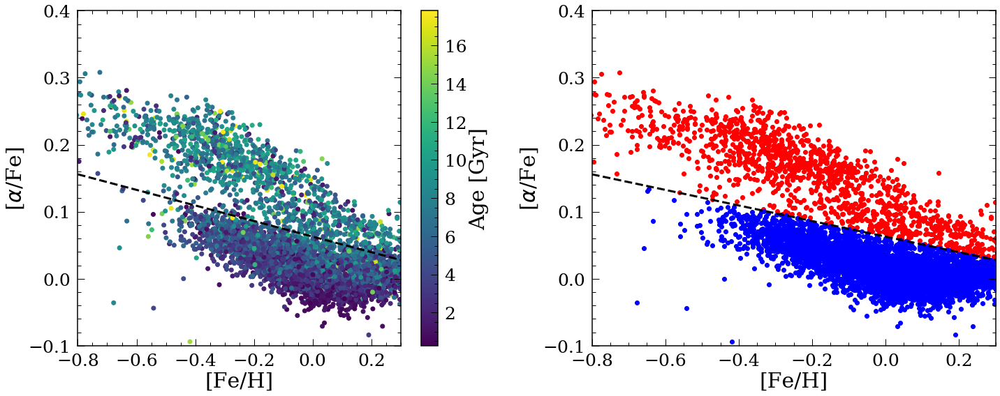

In [109]:
df['Age']=np.power(10,df['LogAge'])/1e3
df['Age_err']=np.power(10,df['E_LogAge'])/1e3

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['FeH'],df['AFe'],c=df['Age'])
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['AFe']-p(df['FeH'])>=0]
low_alpha=df[df['AFe']-p(df['FeH'])<0]

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['FeH'],high_alpha['AFe'],c='r')
plt.scatter(low_alpha['FeH'],low_alpha['AFe'],c='b')
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

In [110]:
#df.to_pickle('ASstars.pkl')

In [20]:
df_abun_st_ha=high_alpha.loc[abs(high_alpha['FeH'])<0.1]
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['GAIA_R_EST']-2000)<1000]

df_abun_st_la=low_alpha.loc[abs(low_alpha['FeH'])<0.1]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['GAIA_R_EST']-2000)<1000]


4585.221139827245 8.033656927837477 0.4609158481223347


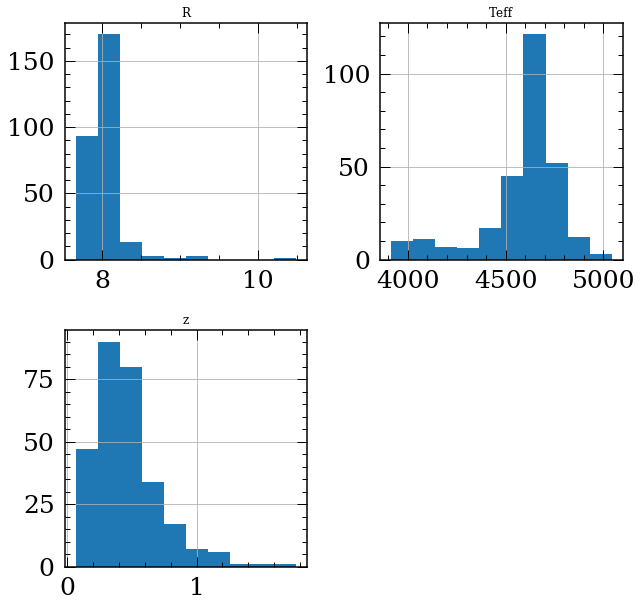

In [21]:
df_abun_st_ha[['R','z','Teff']].hist()
print(np.mean(df_abun_st_ha['Teff']),np.mean(df_abun_st_ha['R']),np.mean(df_abun_st_ha['z']))


## Select temperature range and plot individual element abundance trend

In [22]:
rangeTeff=25
tempcut=4674

rangeR=0.25
Rcut=7.98

rangez=0.5
zcut=0.46

print(len(df_abun_st_ha))
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['Teff']-tempcut)<rangeTeff]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['Teff']-tempcut)<rangeTeff]
print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['R']-Rcut)<rangeR]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['R']-Rcut)<rangeR]
#print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['z']-zcut)<rangez]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['z']-zcut)<rangez]

print(len(df_abun_st_ha))

284
41
41


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x15b5a4748>,
      dtype=object)

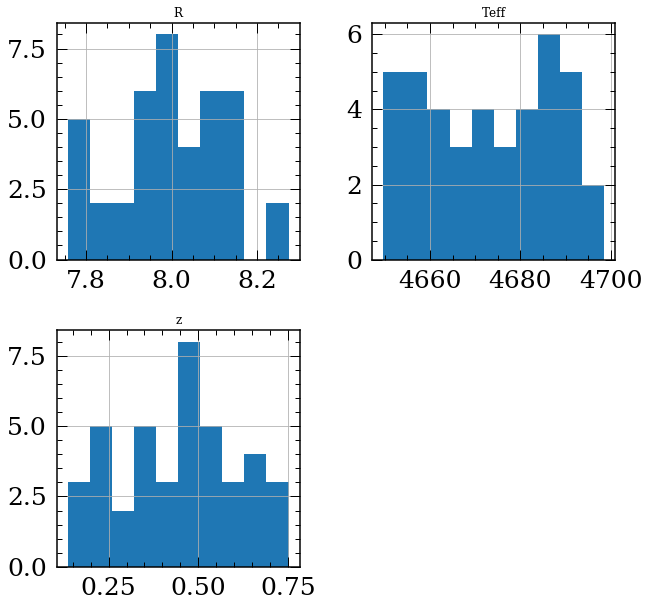

In [23]:
df_abun_st_ha[['R','z','Teff']].hist()


check if there is temp gradient in the trends

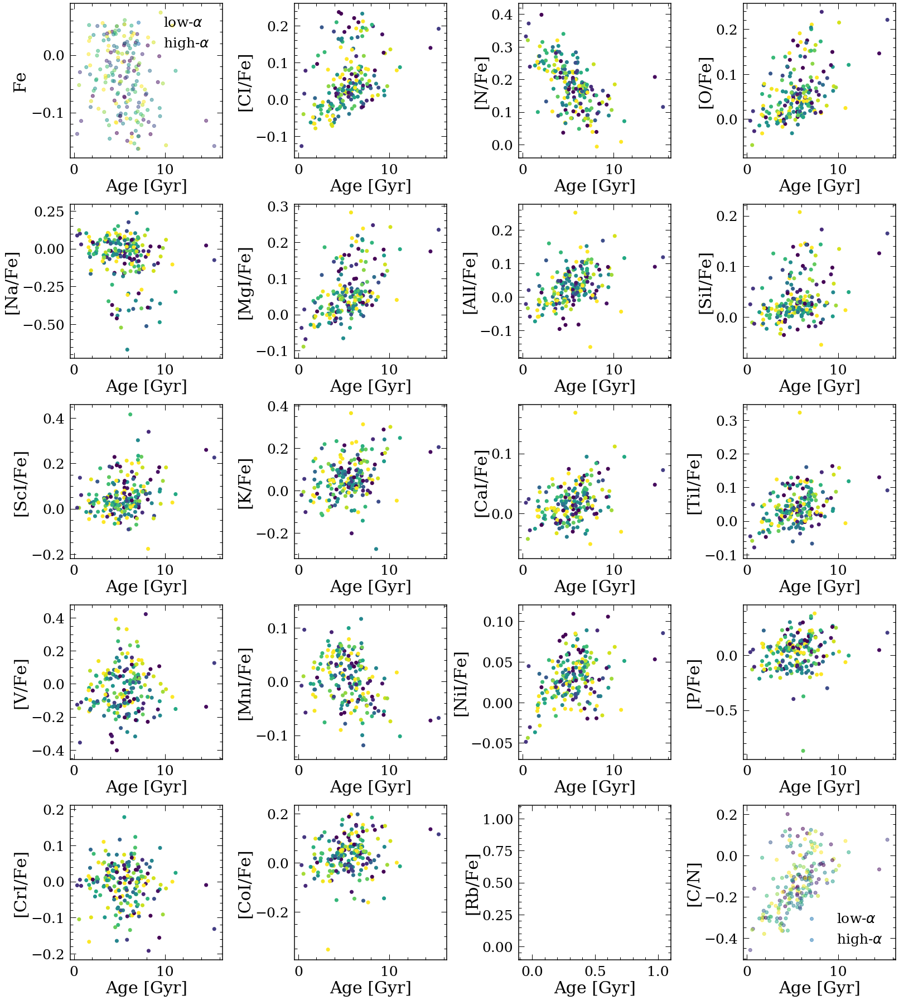

In [24]:
tempcheck(df_abun_st_ha,df_abun_st_la)

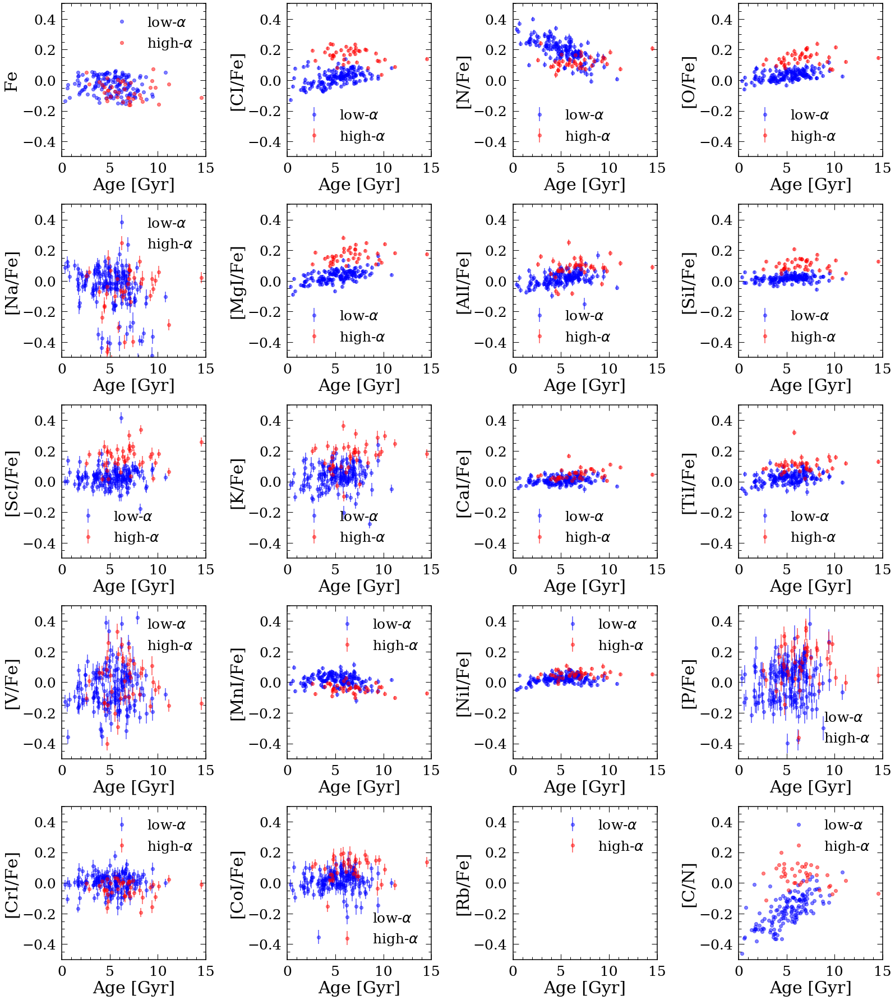

In [25]:
plotraw(df_abun_st_ha,df_abun_st_la)

100%|██████████| 100/100 [00:00<00:00, 608.54it/s]


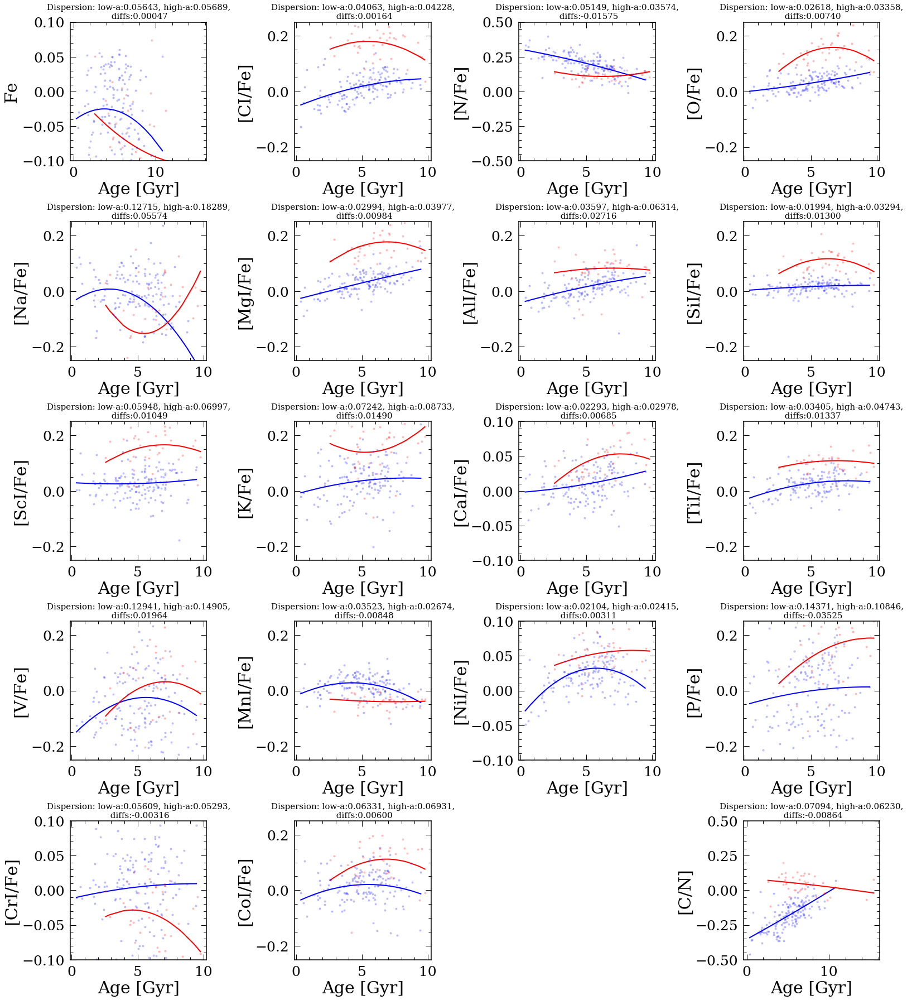

In [30]:
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance','linear',2)


In [31]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
df_disp=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_astro','ha_dis_astro'])
lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis=zip(*sorted(zip(lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis)))
df_disp

,Abund,la_dis_astro,ha_dis_astro
0,CI,0.040634130792191324,0.042278744157594146
1,N,0.051490367847098206,0.03573840521333271
2,O,0.026178751451708858,0.03357511727096162
3,Na,0.1271525678354706,0.18288821452258525
4,MgI,0.029936622541274507,0.03977433979435584
5,AlI,0.035973271453515476,0.06313777986963223
6,SiI,0.01994431328872198,0.032939975739502574
7,ScI,0.05948443087033325,0.06997182703381524
8,K,0.07242216658947458,0.08732545357728856
9,CaI,0.022932648915973946,0.029779562640509273


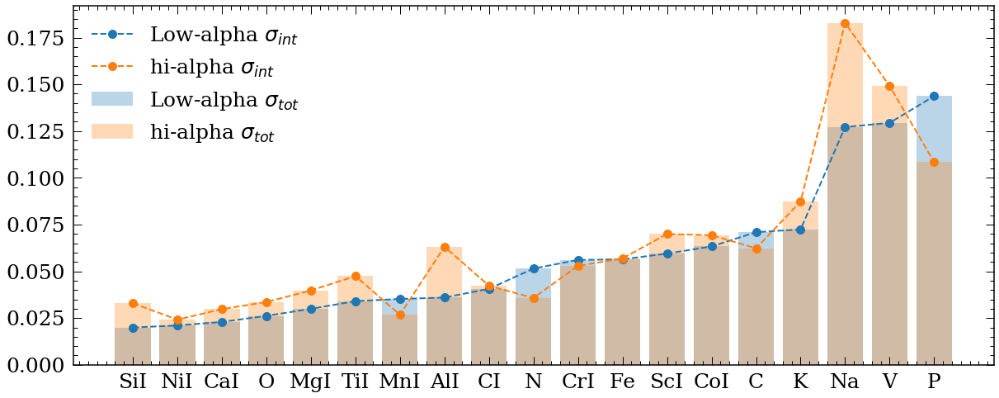

In [32]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
plt.savefig('dispersion_astro.png')

## Calculate dispersion in age bin

100%|██████████| 100/100 [00:00<00:00, 840.93it/s][A

100%|██████████| 100/100 [00:00<00:00, 1103.99it/s]

C_N



/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:698: RuntimeWarning: invalid value encountered in double_scalars
100%|██████████| 100/100 [00:00<00:00, 671.48it/s][A

100%|██████████| 100/100 [00:00<00:00, 657.09it/s][A

100%|██████████| 100/100 [00:00<00:00, 509.16it/s][A

100%|██████████| 100/100 [00:00<00:00, 404.30it/s][A

100%|██████████| 100/100 [00:00<00:00, 368.30it/s][A

100%|██████████| 100/100 [00:00<00:00, 395.39it/s][A

100%|██████████| 100/100 [00:00<00:00, 494.18it/s][A

100%|██████████| 100/100 [00:00<00:00, 668.57it/s][A

100%|██████████| 100/100 [00:00<00:00, 1024.36it/s]

100%|██████████| 10/10 [00:03<00:00,  3.05it/s]


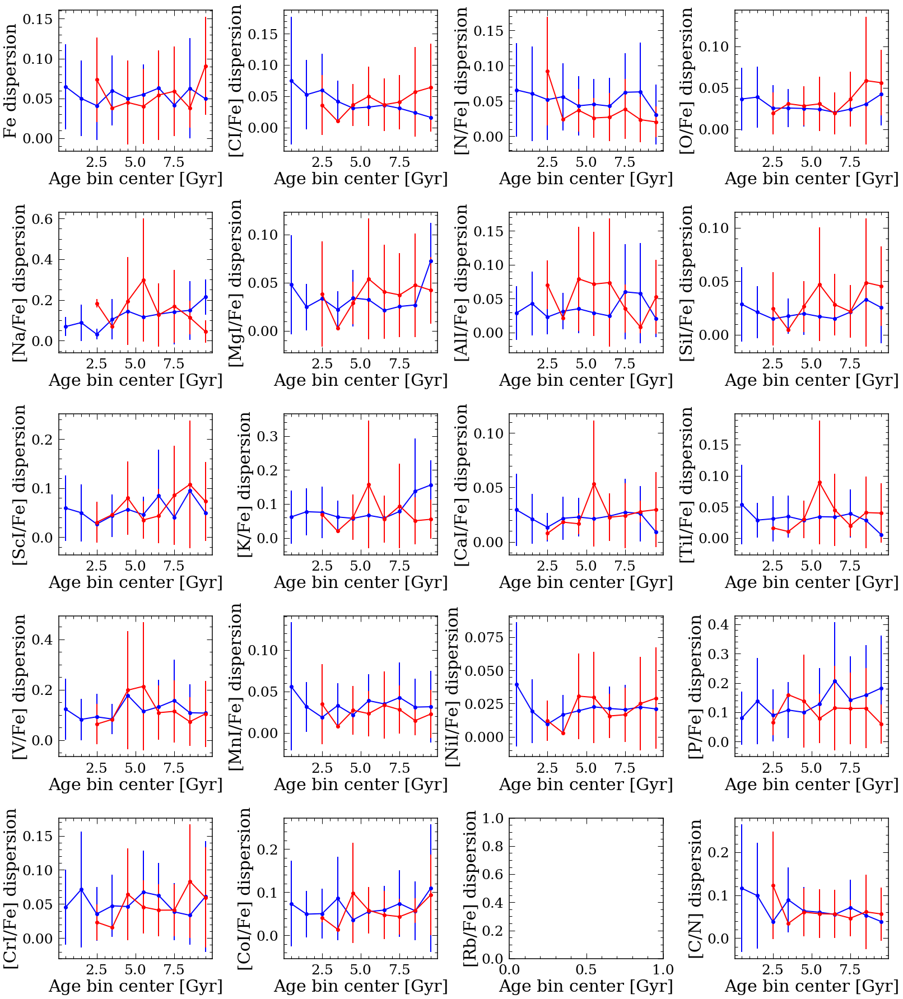

In [30]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# For red clump stars from the cannon

## Get high/low-$\alpha$ disk

In [111]:
df_CM=pd.read_pickle('CannonDR16.pkl')
print('before cutting:',len(df_CM))
# After cutting
#df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
#df=df.loc[df['TEFF']<5200]
#print('after cutting:',len(df))

# get red clump stars
df=df_CM.loc[df_CM['DP']>230]



before cutting: 116301


In [112]:
print('rc stars',len(df))

rc stars 49158


116301 49158


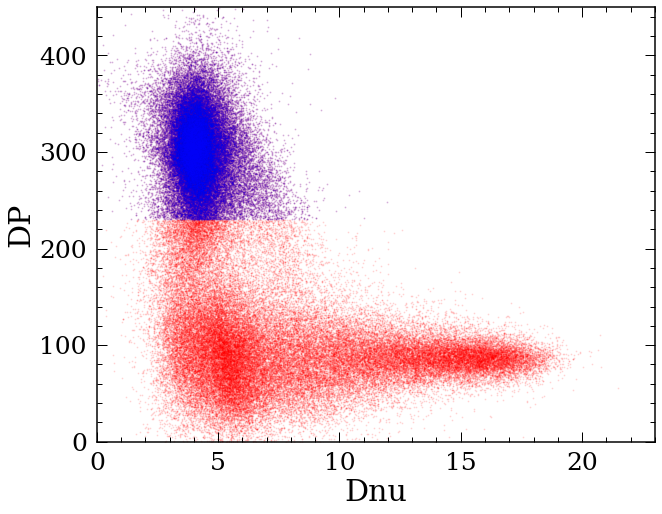

In [35]:
plt.figure(figsize=(10,8))
plt.scatter(df_CM['Dnu'],df_CM['DP'],c='r',alpha=0.1,s=1,label='All')
plt.scatter(df['Dnu'],df['DP'],c='b',alpha=0.1,s=1,label='Red Clumps')
plt.ylim([0,450])
plt.xlim([0,23])
plt.xlabel('Dnu')
plt.ylabel('DP')
print(len(df_CM),len(df))



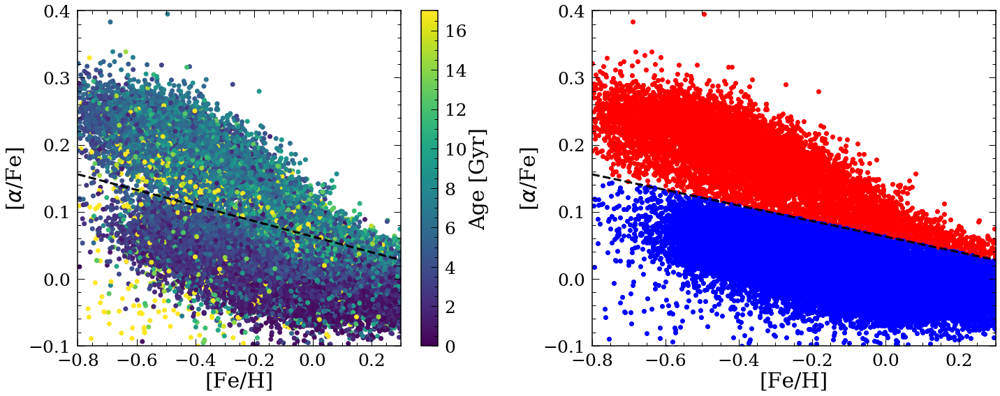

In [36]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['ALPHA_M'],c=df['Age'],vmin=0,vmax=17)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['ALPHA_M']-p(df['M_H'])>=0]
low_alpha=df[df['ALPHA_M']-p(df['M_H'])<0]

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['ALPHA_M'],c='r')
plt.scatter(low_alpha['M_H'],low_alpha['ALPHA_M'],c='b')
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

In [37]:
df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<0.1]
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['GAIA_R_EST']-2000)<1000]

df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<0.1]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['GAIA_R_EST']-2000)<1000]



4664.55078125
(1006, 227)


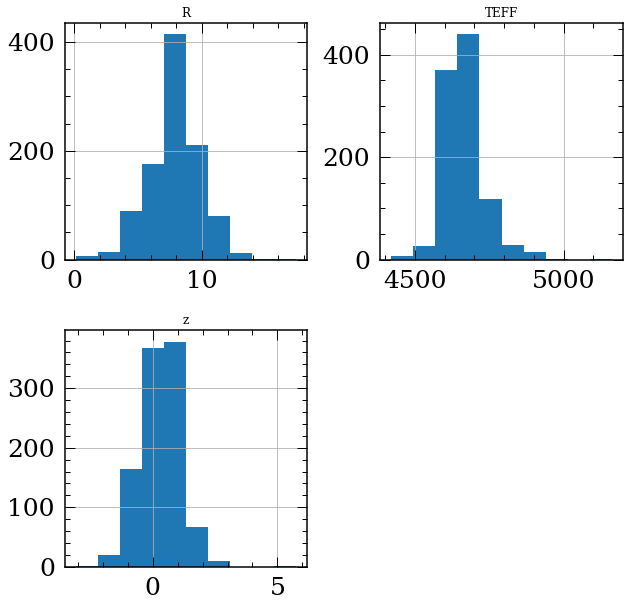

In [38]:
df_abun_st_ha[['R','z','TEFF']].hist()
print(np.mean(df_abun_st_ha['TEFF']))
print(np.shape(df_abun_st_ha))

## Select temperature range and plot individual element abundance trend

In [39]:
rangeTeff=25
tempcut=4674

rangeR=0.25
Rcut=7.98

rangez=0.5
zcut=0.46

print(len(df_abun_st_ha))
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF']-tempcut)<rangeTeff]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF']-tempcut)<rangeTeff]
print(len(df_abun_st_ha),len(df_abun_st_la))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['R']-Rcut)<rangeR]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['R']-Rcut)<rangeR]
#print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['z']-zcut)<rangez]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['z']-zcut)<rangez]
#print(len(df_abun_st_ha))

1006
304 707


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1666c5c18>,
      dtype=object)

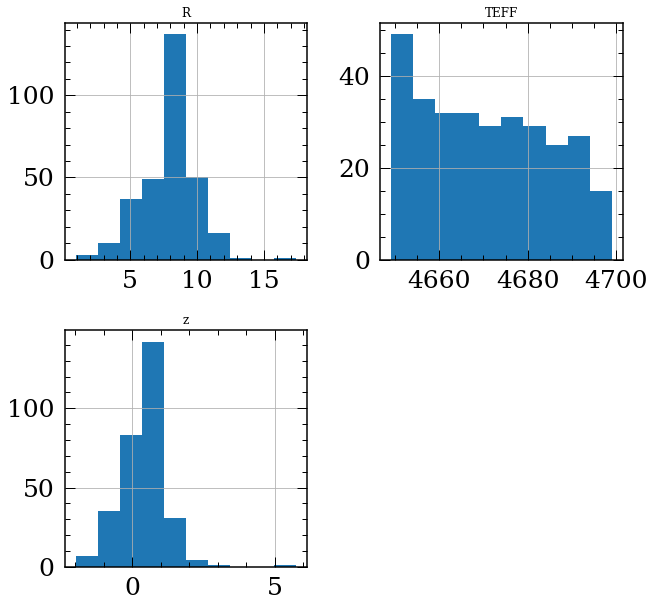

In [40]:
df_abun_st_ha[['R','z','TEFF']].hist()



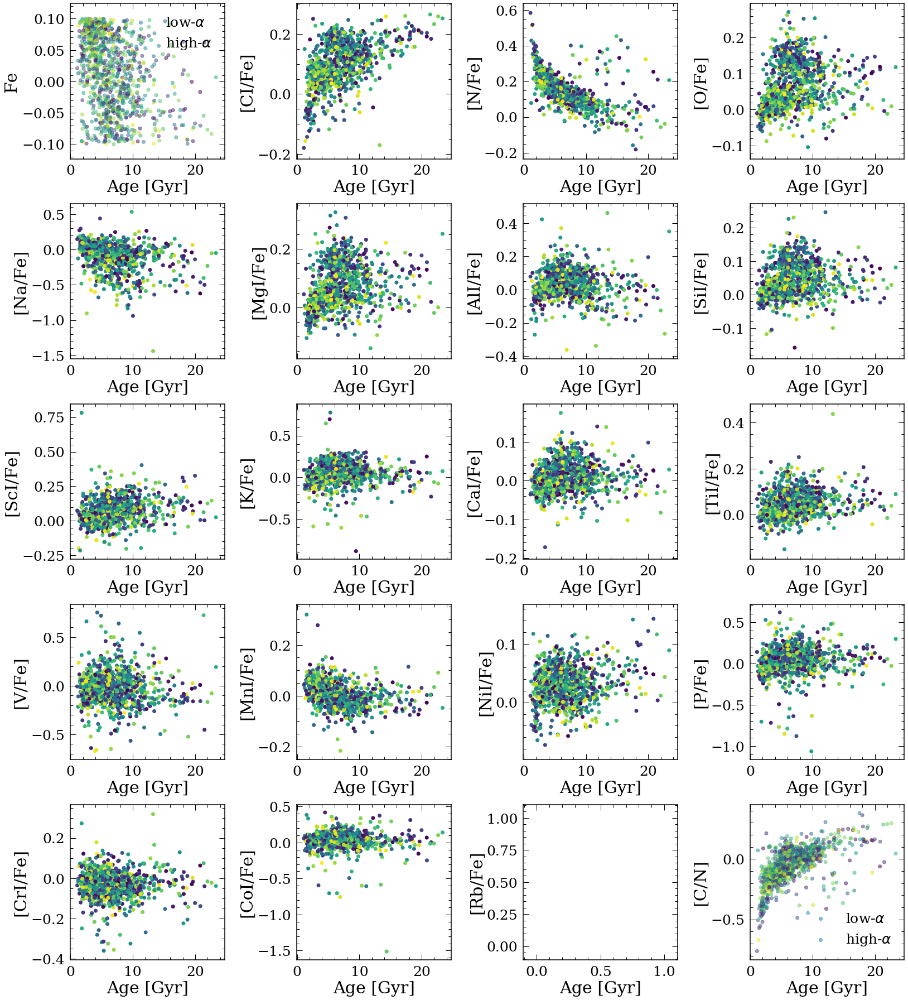

In [41]:
tempcheck(df_abun_st_ha,df_abun_st_la)


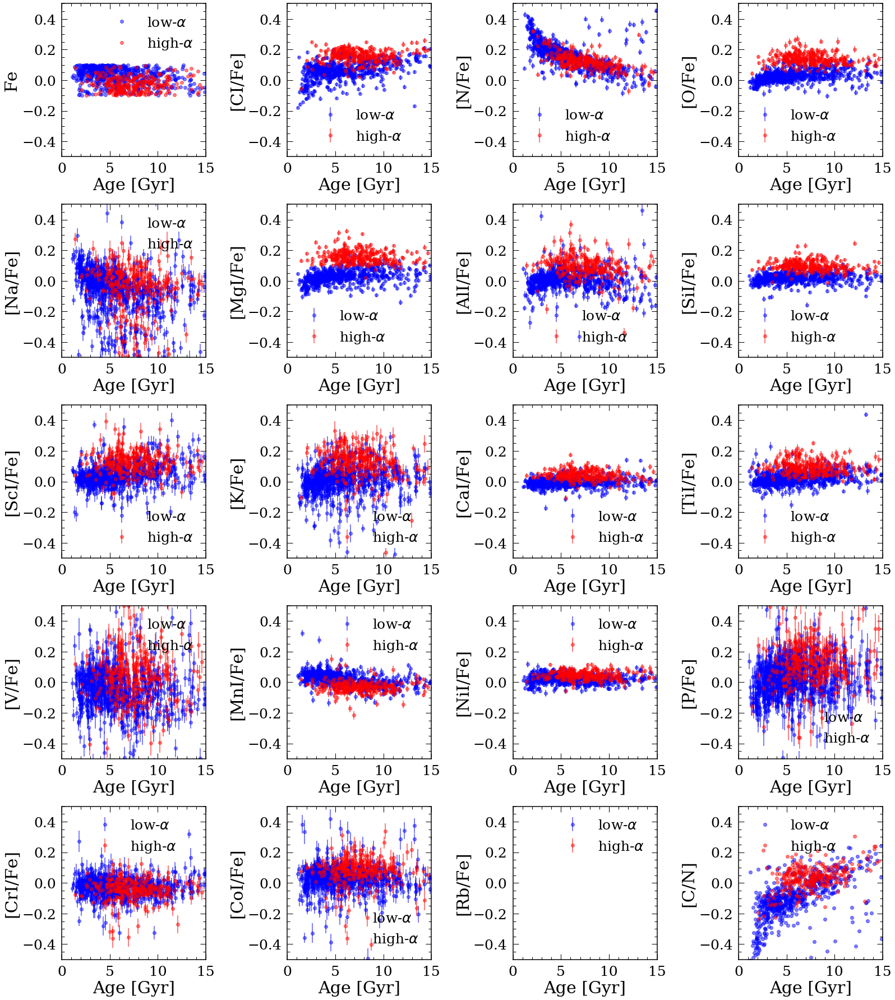

In [42]:
plotraw(df_abun_st_ha,df_abun_st_la)


100%|██████████| 100/100 [00:00<00:00, 154.79it/s]


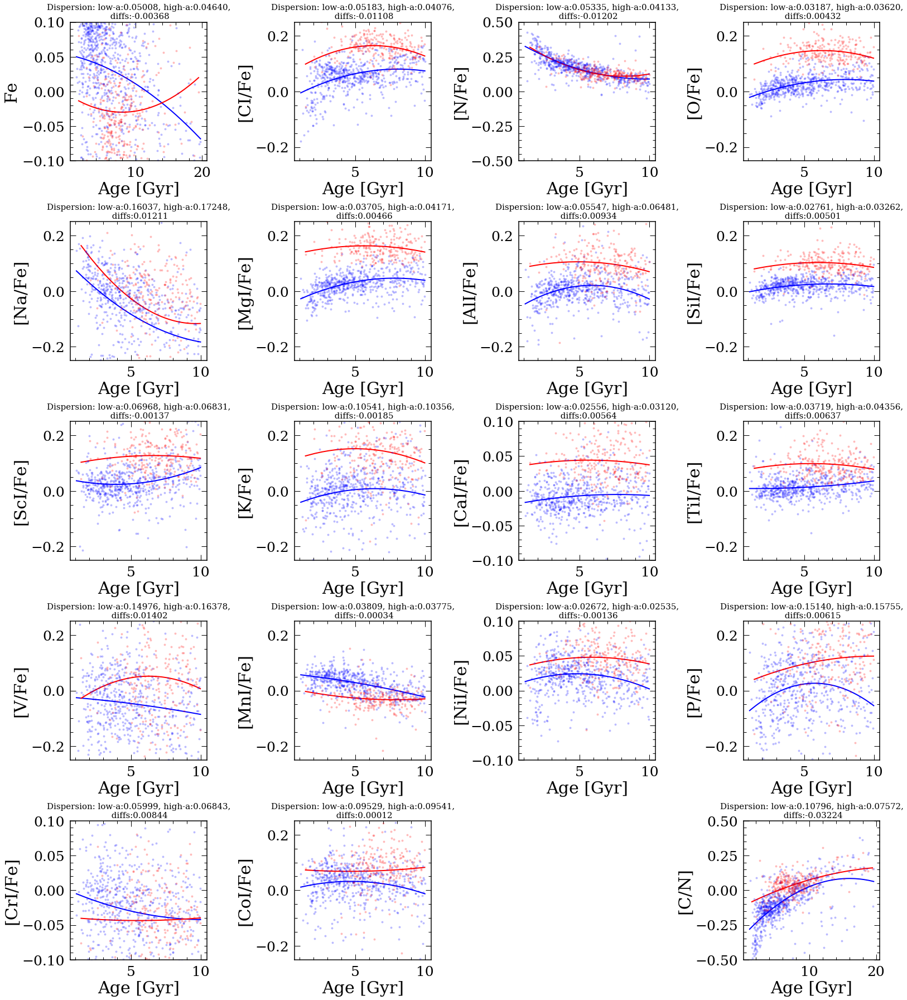

In [43]:
#hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon_rc')
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon_rc','linear',2)


In [44]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
df_disp_rc=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_rc','ha_dis_rc'])

lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis=zip(*sorted(zip(lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis)))
#tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis=zip(*sorted(zip(tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis)))
df_disp_rc

,Abund,la_dis_rc,ha_dis_rc
0,CI,0.05183391032625508,0.04075519072829109
1,N,0.053353923700436845,0.041333610520911654
2,O,0.03187102068376062,0.036195377102846184
3,Na,0.16037010740896349,0.1724815280628775
4,MgI,0.03704587520374666,0.04171039954228516
5,AlI,0.05547377525269033,0.06481235898839825
6,SiI,0.027611348775925245,0.03262042026580716
7,ScI,0.06968110335633662,0.06830925004415597
8,K,0.10541405505244353,0.10356104224325585
9,CaI,0.025563304246542833,0.031199841701989955


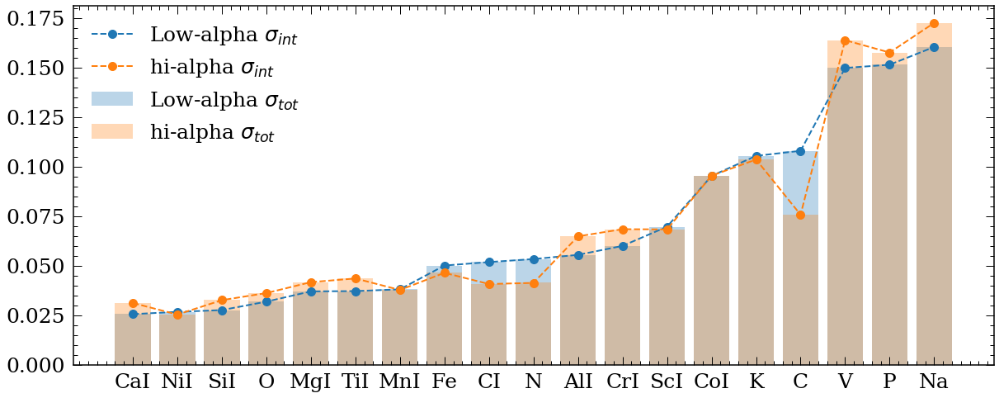

In [45]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
plt.savefig('dispersion_cannon_rc.png')

100%|██████████| 100/100 [00:00<00:00, 1178.15it/s]

100%|██████████| 100/100 [00:00<00:00, 1195.99it/s]
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:784: RuntimeWarning: invalid value encountered in double_scalars
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:785: RuntimeWarning: invalid value encountered in double_scalars
 10%|█         | 1/10 [00:00<00:01,  5.25it/s]


C_N


100%|██████████| 100/100 [00:00<00:00, 300.16it/s][A

100%|██████████| 100/100 [00:00<00:00, 103.65it/s][A

100%|██████████| 100/100 [00:01<00:00, 87.76it/s][A

100%|██████████| 100/100 [00:01<00:00, 77.91it/s][A

100%|██████████| 100/100 [00:00<00:00, 124.27it/s][A

100%|██████████| 100/100 [00:00<00:00, 164.21it/s][A

100%|██████████| 100/100 [00:00<00:00, 218.99it/s][A

100%|██████████| 100/100 [00:00<00:00, 270.03it/s][A

100%|██████████| 100/100 [00:00<00:00, 292.26it/s][A

100%|██████████| 10/10 [00:09<00:00,  1.07it/s]


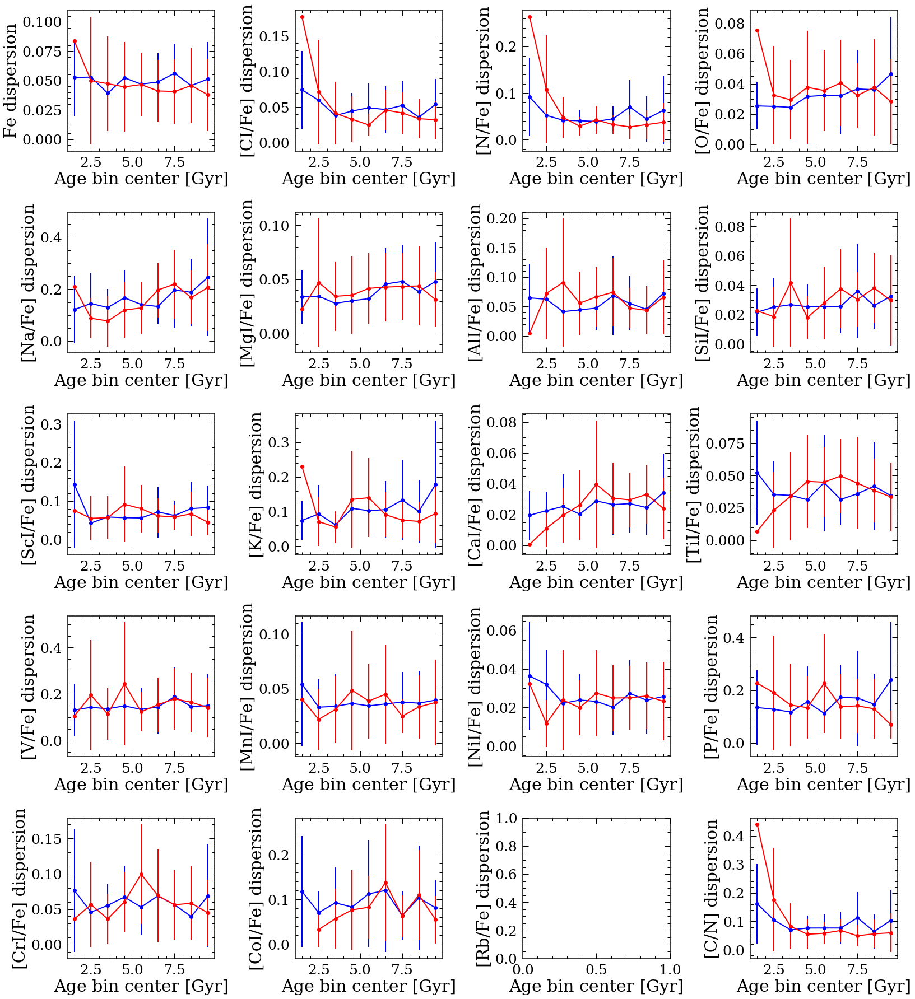

In [46]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# All stars from the cannon

before cutting: 116301
after cutting: 115982


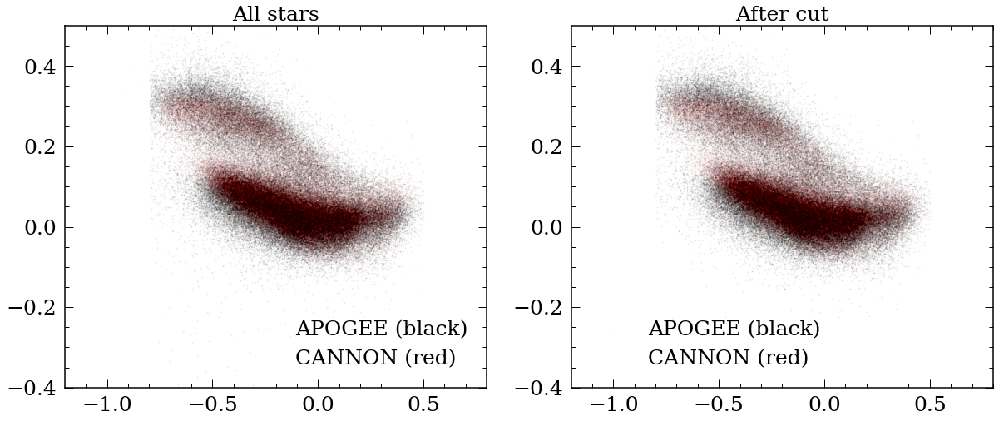

In [47]:
df=pd.read_pickle('CannonDR16.pkl')
print('before cutting:',len(df))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('All stars',fontsize=25)
plt.legend()

# After cutting
df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
df=df.loc[df['TEFF']<5200]


plt.subplot(1,2,2)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('After cut',fontsize=25)
plt.legend()

print('after cutting:',len(df))



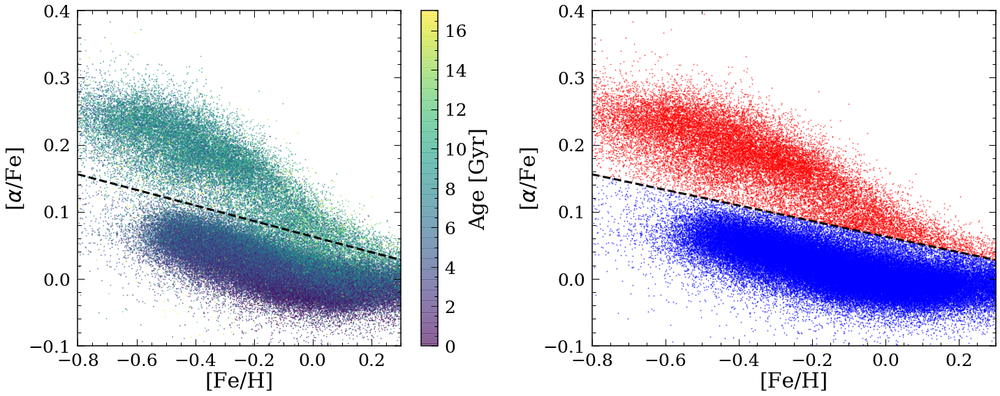

In [48]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['ALPHA_M'],c=df['Age'],s=1,vmin=0,vmax=17,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['ALPHA_M']-p(df['M_H'])>=0]
low_alpha=df[df['ALPHA_M']-p(df['M_H'])<0]

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['ALPHA_M'],c='r',s=1,alpha=0.5)
plt.scatter(low_alpha['M_H'],low_alpha['ALPHA_M'],c='b',s=1,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

In [49]:
df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<0.1]
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['GAIA_R_EST']-2000)<1000]


df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<0.1]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['GAIA_R_EST']-2000)<1000]


#df_abun_st_ha['M_H'].hist()

In [50]:
rangeTeff=25
tempcut=4674

rangeR=0.25
Rcut=7.98

rangez=0.5
zcut=0.46

print(len(df_abun_st_ha))
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF']-tempcut)<rangeTeff]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF']-tempcut)<rangeTeff]
print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['R']-Rcut)<rangeR]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['R']-Rcut)<rangeR]
#print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['z']-zcut)<rangez]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['z']-zcut)<rangez]
#print(len(df_abun_st_ha))

2882
518


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x15914f358>,
      dtype=object)

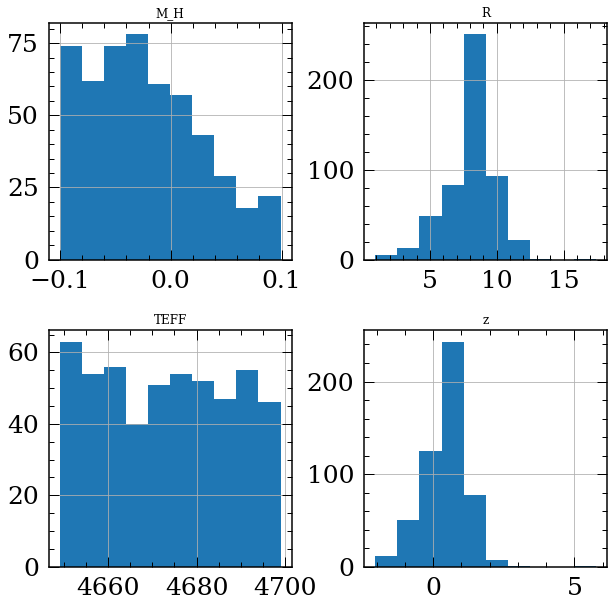

In [51]:
df_abun_st_ha[['R','z','TEFF','M_H']].hist()




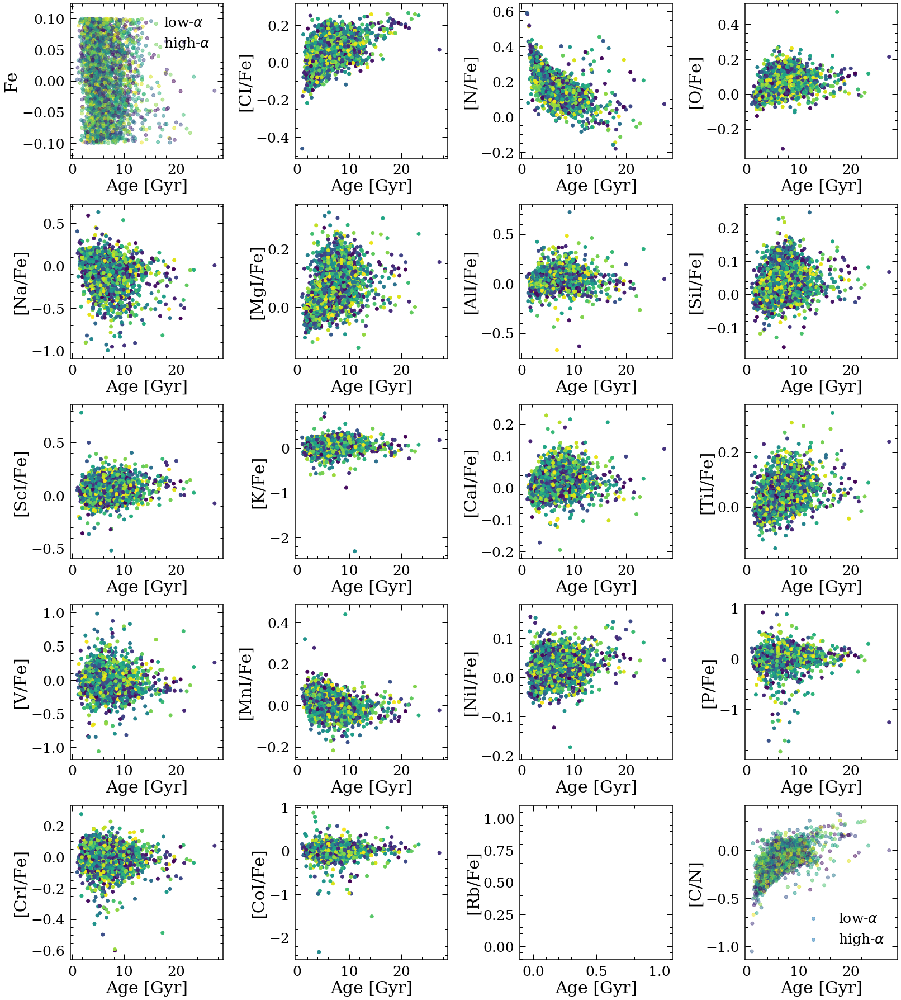

In [52]:
tempcheck(df_abun_st_ha,df_abun_st_la)



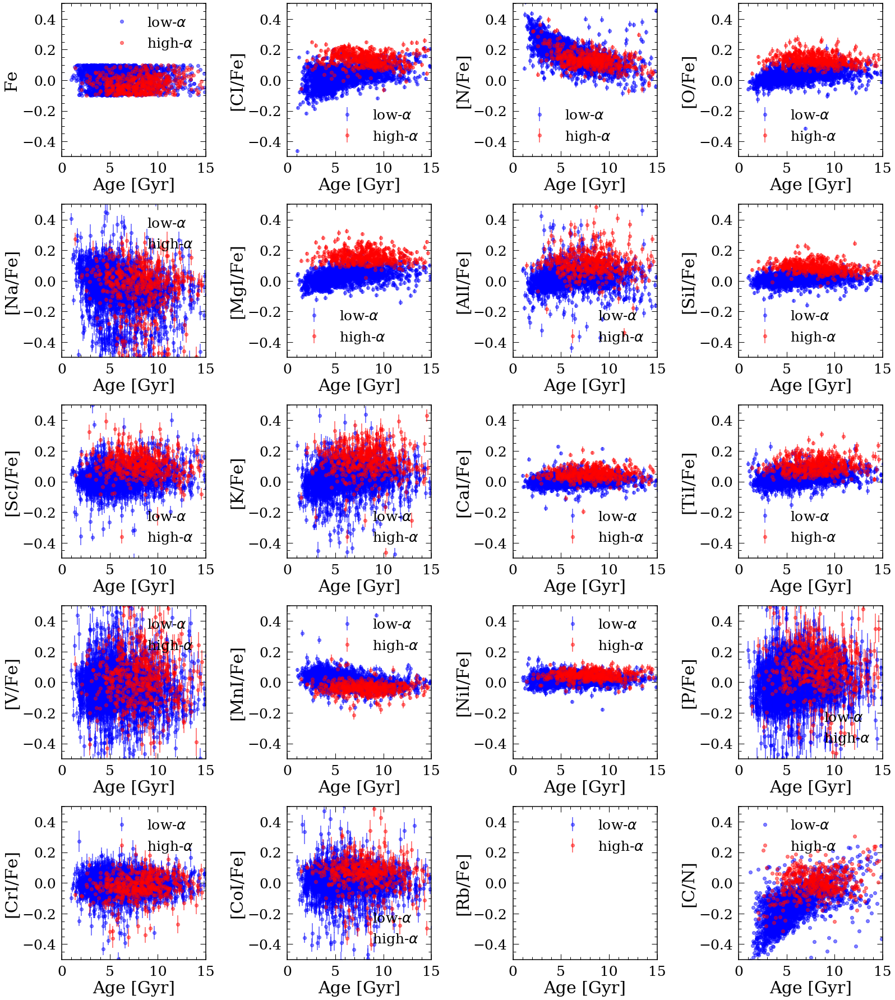

In [53]:
plotraw(df_abun_st_ha,df_abun_st_la)



100%|██████████| 100/100 [00:00<00:00, 106.14it/s]


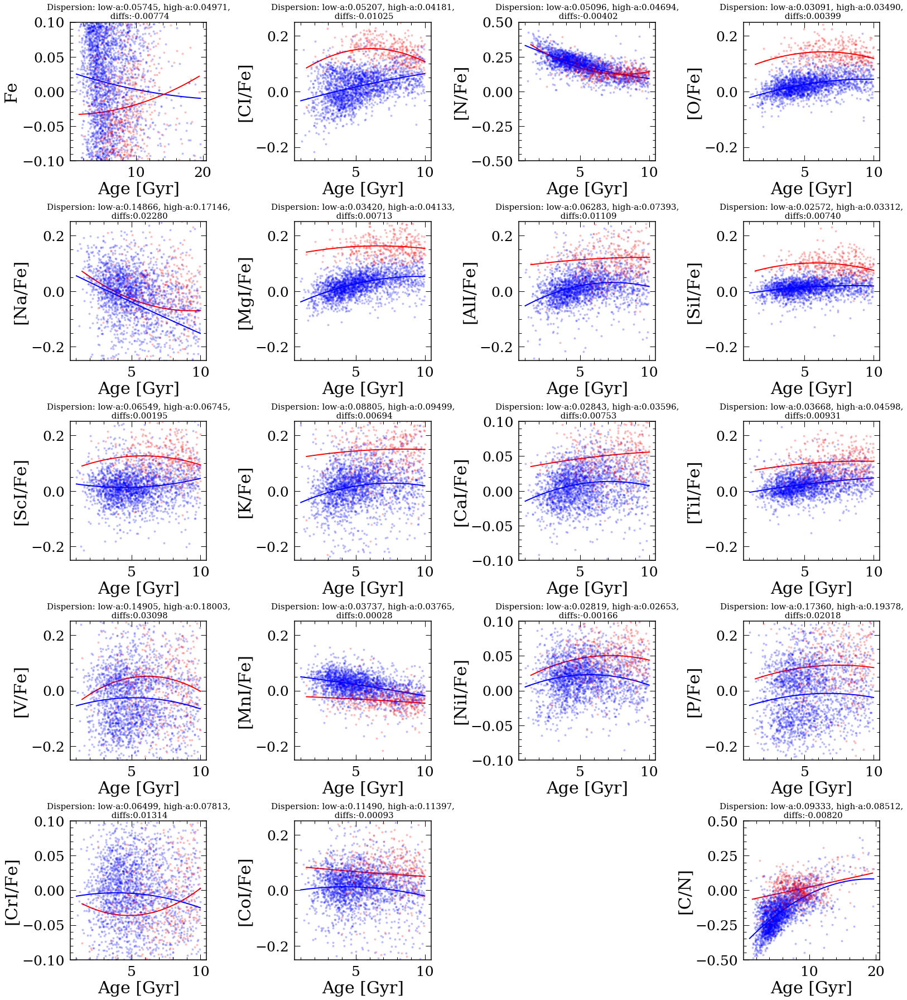

In [74]:
#hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon')
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon','linear',2)




In [55]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
df_disp_all=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_all','ha_dis_all'])


lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis=zip(*sorted(zip(lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis)))
#tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis=zip(*sorted(zip(tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis)))

df_abun_st_ha

,ID,[Fe/H],T_{eff},Log(g),[Mg/Fe],DP,Dnu,LogAge,[Fe/H]_err,T_{eff}_err,...,LOGG_SPEC,FLAGREAD,X,Y,z,R,Age,Age_err,LogAge_upp,LogAge_low
1112,2M19580716+4035378,-0.104703,4652.357461,2.329150,0.168776,309.230335,3.460360,3.730962,0.016477,0.028962,...,2.6163,0,0.728063,-2.906272,0.309769,8.017248,5.382230,2.848762,8938.412146,3240.889088
1197,2M18494767-2854253,-0.020128,4691.348612,2.391997,0.192156,299.141079,4.713349,3.892998,0.011281,0.019718,...,2.6618,0,1.730520,-0.200508,-0.383202,6.472587,7.816236,3.891969,12623.576956,4839.638563
1564,2M08253188+2043157,-0.038757,4696.788846,2.898457,0.196210,50.097455,10.321882,3.989914,0.011635,0.025172,...,3.1234,0,-0.900539,0.388886,0.556690,9.108844,9.770433,4.820636,15715.583298,6074.311688
3008,2M20272100+1639046,-0.073698,4689.169419,2.451420,0.203209,279.854092,4.825658,3.697629,0.013977,0.026886,...,2.7248,0,2.172282,-3.647998,-0.938578,7.045657,4.984590,2.556654,8158.673072,3045.365086
3206,2M17090915+3221244,-0.082994,4684.608863,2.651930,0.116499,69.741765,6.304746,3.662218,0.011339,0.025786,...,2.8290,0,0.344292,-0.493041,0.415601,7.871165,4.594280,2.308101,7449.573998,2833.371767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242174,2M07485213+0905310,-0.073449,4675.005046,2.794164,0.211232,61.566085,8.899555,3.900241,0.011589,0.024666,...,3.0229,0,-0.775896,0.469835,0.274836,8.988184,7.947697,3.939044,12809.329498,4931.241278
242272,2M03545103+2544457,-0.082539,4652.103254,2.709645,0.122326,76.868342,6.372193,3.962600,0.012143,0.026505,...,2.8353,0,-1.249555,-0.293356,-0.495700,9.454108,9.174864,4.562935,14809.812335,5683.943140
243126,2M08181231+1610062,-0.066939,4679.778780,2.313220,0.161707,301.238916,4.111956,3.796390,0.014629,0.024870,...,2.5921,0,-2.283323,1.185104,1.270881,10.550096,6.257347,3.203797,10233.641126,3826.047036
244034,2M00152634+6330516,-0.057803,4612.683194,2.368793,0.078147,297.470131,3.259296,3.829985,0.016831,0.030853,...,2.6346,0,-2.020823,-3.656038,0.067282,10.855037,6.760590,3.533000,11161.083922,4095.083901


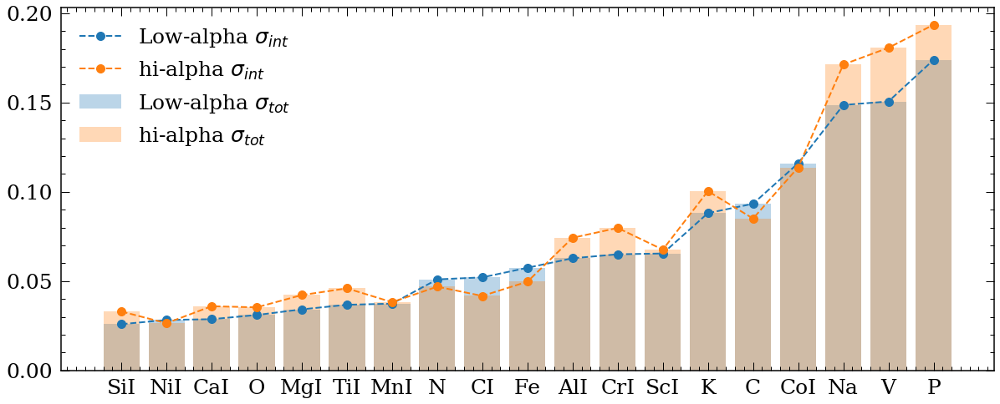

In [57]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
plt.savefig('dispersion_cannon.png')

100%|██████████| 100/100 [00:00<00:00, 1139.41it/s]

100%|██████████| 100/100 [00:00<00:00, 1195.47it/s]
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:697: RuntimeWarning: invalid value encountered in double_scalars
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:698: RuntimeWarning: invalid value encountered in double_scalars
 10%|█         | 1/10 [00:00<00:01,  5.02it/s]

C_N



100%|██████████| 100/100 [00:00<00:00, 256.70it/s][A

100%|██████████| 100/100 [00:02<00:00, 43.01it/s]

100%|██████████| 100/100 [00:12<00:00,  8.30it/s]

100%|██████████| 100/100 [00:16<00:00,  6.25it/s]

100%|██████████| 100/100 [00:08<00:00, 11.13it/s]

 40%|████      | 40/100 [00:02<00:03, 18.68it/s]


100%|██████████| 100/100 [00:05<00:00, 18.95it/s]

100%|██████████| 100/100 [00:02<00:00, 37.50it/s][A

100%|██████████| 100/100 [00:01<00:00, 61.67it/s][A

100%|██████████| 100/100 [00:01<00:00, 73.82it/s]

100%|██████████| 10/10 [00:55<00:00,  5.52s/it]


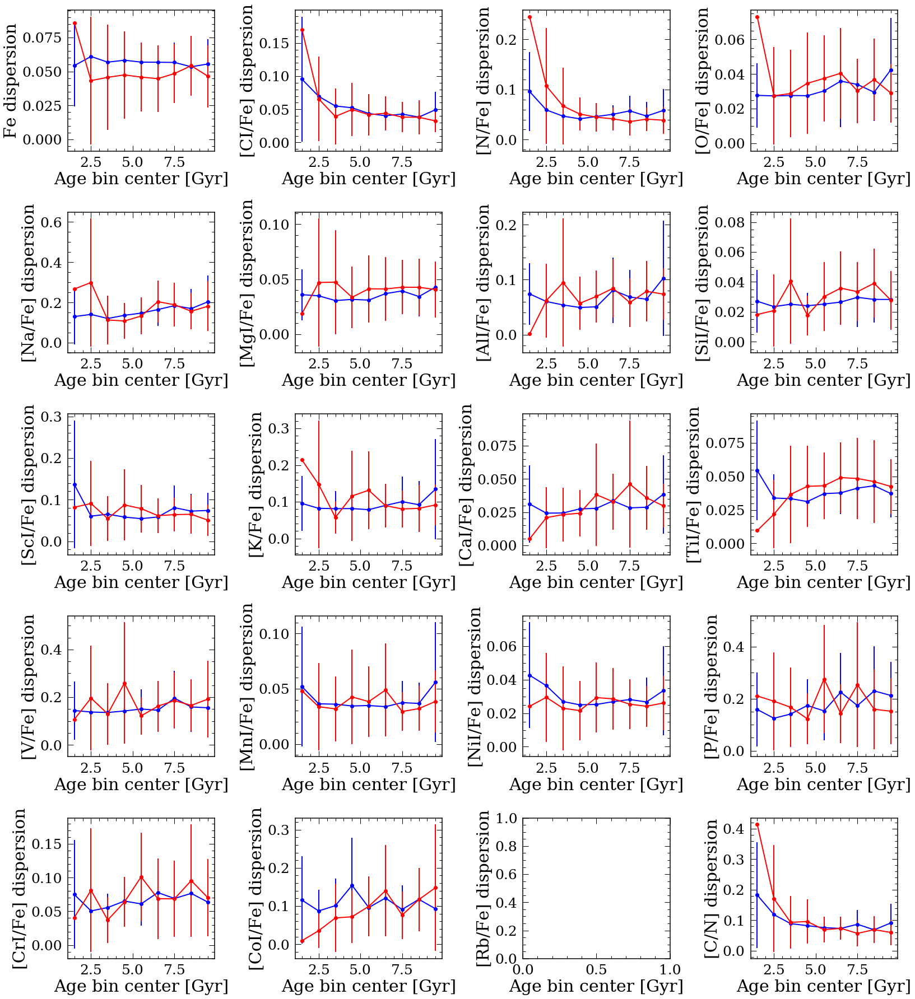

In [60]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# compare all intrinsic dispersion

In [90]:
df_disp_plot=pd.merge(df_disp,df_disp_rc,left_on='Abund',right_on='Abund',how='inner')
df_disp_plot=pd.merge(df_disp_plot,df_disp_all,left_on='Abund',right_on='Abund',how='inner')
for i in df_disp_plot.columns:
    if i!='Abund':
        df_disp_plot[i]=[float(j) for j in df_disp_plot[i]]
#df_disp_plot.to_pickle('intrinsic.pkl')
df_disp_plot['Abund'].iloc[18]='C/N'

/Users/lucy/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [91]:

df_abun_st_ha['C_N']=df_abun_st_ha['C_FE']-df_abun_st_ha['N_FE']
df_abun_st_ha['C_N_ERR']=np.sqrt(df_abun_st_ha['C_FE_ERR']**2.+df_abun_st_ha['N_FE_ERR']**2.)


df_abun_st_la['C_N']=df_abun_st_la['C_FE']-df_abun_st_la['N_FE']
df_abun_st_la['C_N_ERR']=np.sqrt(df_abun_st_la['C_FE_ERR']**2.+df_abun_st_la['N_FE_ERR']**2.)


In [92]:
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc,la_dis_all,ha_dis_all
0,CI,0.040634,0.042279,0.051834,0.040755,0.052104,0.041721
1,N,0.051490,0.035738,0.053354,0.041334,0.050976,0.046901
2,O,0.026179,0.033575,0.031871,0.036195,0.031033,0.035323
3,Na,0.127153,0.182888,0.160370,0.172482,0.148617,0.171255
4,MgI,0.029937,0.039774,0.037046,0.041710,0.034209,0.042209
5,AlI,0.035973,0.063138,0.055474,0.064812,0.062799,0.074245
6,SiI,0.019944,0.032940,0.027611,0.032620,0.025902,0.033005
7,ScI,0.059484,0.069972,0.069681,0.068309,0.065473,0.067635
8,K,0.072422,0.087325,0.105414,0.103561,0.088073,0.100370
9,CaI,0.022933,0.029780,0.025563,0.031200,0.028704,0.035950


In [93]:
elements=['C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE','V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','M_H','C_N']
ha_err=[]
la_err=[]
for i in elements:
    df_abun_st_ha=df_abun_st_ha.loc[df_abun_st_ha[i+"_ERR"]>0]
    df_abun_st_la=df_abun_st_la.loc[df_abun_st_la[i+"_ERR"]>0]
    ha_err.append(np.mean(df_abun_st_ha[i+"_ERR"].dropna()))
    la_err.append(np.mean(df_abun_st_la[i+"_ERR"].dropna()))
    
df_disp_plot['ha_err_all']=ha_err
df_disp_plot['la_err_all']=la_err


In [95]:
df_disp_plot['diff']=abs(df_disp_plot['la_dis_astro']-df_disp_plot['ha_dis_astro'])

In [96]:
df_disp_plot=df_disp_plot.sort_values(by='diff')

In [103]:
#df_disp_plot.to_pickle('intrinsic.pkl')

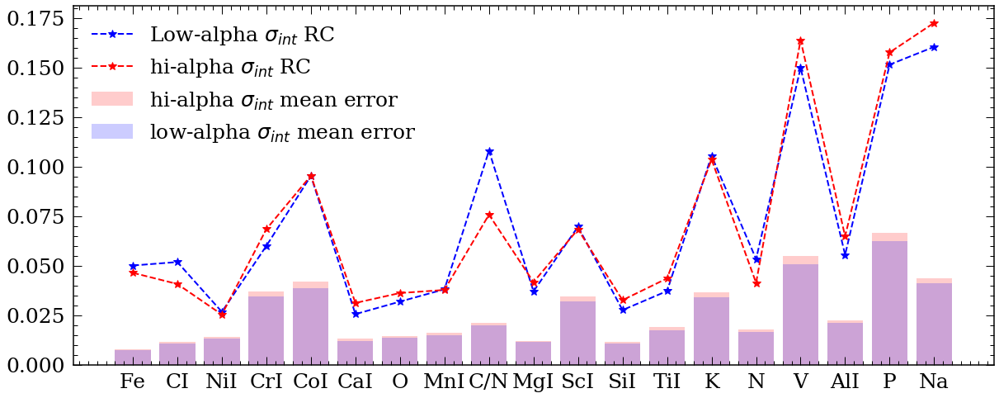

In [102]:
plt.figure(figsize=(20,8))
#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_astro'],'b--o',label='Low-alpha $\sigma_{int}$ Astro',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_astro'],'r--o',label='hi-alpha $\sigma_{int}$ Astro',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_rc'],'b--*',label='Low-alpha $\sigma_{int}$ RC',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_rc'],'r--*',label='hi-alpha $\sigma_{int}$ RC',markersize=10)

#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_all'],'b--.',label='Low-alpha $\sigma_{int}$ all',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_all'],'r--.',label='hi-alpha $\sigma_{int}$ all',markersize=10)

plt.bar(df_disp_plot['Abund'].values,df_disp_plot['ha_err_all'].values,alpha=0.2,
        color='r',label='hi-alpha $\sigma_{int}$ mean error')
plt.bar(df_disp_plot['Abund'].values,df_disp_plot['la_err_all'].values,alpha=0.2,
        color='b',label='low-alpha $\sigma_{int}$ mean error')

plt.legend()
plt.savefig('dispersion_comp_2dpoly_rc.png')

In [ ]:
plt.figure(figsize=(20,8))
#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_astro'],'b--o',label='Low-alpha $\sigma_{int}$ Astro',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_astro'],'r--o',label='hi-alpha $\sigma_{int}$ Astro',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_rc'],'b--*',label='Low-alpha $\sigma_{int}$ RC',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_rc'],'r--*',label='hi-alpha $\sigma_{int}$ RC',markersize=10)

#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_all'],'b--.',label='Low-alpha $\sigma_{int}$ all',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_all'],'r--.',label='hi-alpha $\sigma_{int}$ all',markersize=10)

plt.bar(df_disp_plot['Abund'].values,df_disp_plot['ha_err_all'].values,alpha=0.2,
        color='r',label='hi-alpha $\sigma_{int}$ mean error')
plt.bar(df_disp_plot['Abund'].values,df_disp_plot['la_err_all'].values,alpha=0.2,
        color='b',label='low-alpha $\sigma_{int}$ mean error')

plt.legend()
plt.savefig('dispersion_comp_2dpoly_rc.png')

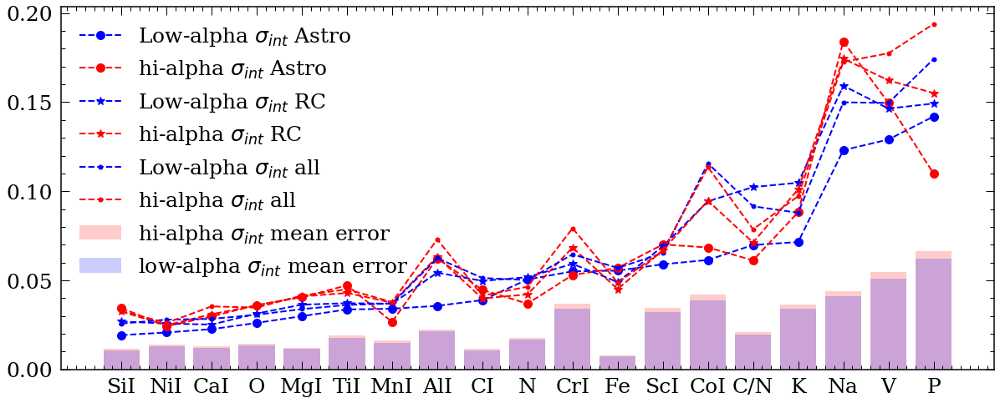

In [128]:
plt.figure(figsize=(20,8))
plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_astro'],'b--o',label='Low-alpha $\sigma_{int}$ Astro',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_astro'],'r--o',label='hi-alpha $\sigma_{int}$ Astro',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_rc'],'b--*',label='Low-alpha $\sigma_{int}$ RC',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_rc'],'r--*',label='hi-alpha $\sigma_{int}$ RC',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_all'],'b--.',label='Low-alpha $\sigma_{int}$ all',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_all'],'r--.',label='hi-alpha $\sigma_{int}$ all',markersize=10)

plt.bar(df_disp_plot['Abund'].values,df_disp_plot['ha_err_all'].values,alpha=0.2,
        color='r',label='hi-alpha $\sigma_{int}$ mean error')
plt.bar(df_disp_plot['Abund'].values,df_disp_plot['la_err_all'].values,alpha=0.2,
        color='b',label='low-alpha $\sigma_{int}$ mean error')

plt.legend()
plt.savefig('dispersion_comp.png')

In [94]:
df_disp_plot['ha_err_all']

6     0.011561
13    0.014226
9     0.013293
2     0.014534
4     0.012191
10    0.018998
12    0.016395
5     0.022728
0     0.011516
1     0.017724
15    0.037217
17    0.007713
7     0.034780
16   -1.888546
18    0.021140
8    -1.893795
3    -1.886666
11    0.055004
14   -1.863906
Name: ha_err_all, dtype: float64

# calculate gradient for high/low alpha disk

In [114]:
"""
# log age errors
def calcgrad(age,abund,age_err,abund_err):
    zs=np.zeros(100)
    bs=np.zeros(100)
    for i in trange(100):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newage=10**newage/1000
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(newage,newabund,1)
        p=np.poly1d(fits)
        plt.plot(newage,p(newage),'r-',alpha=0.5)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    p=np.poly1d(fits)
    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)
    return np.mean(zs),np.std(zs),np.mean(bs),np.std(bs)
"""
"""
# with age err
def calcgrad(age,abund,age_err,abund_err):
    sampsize=50
    plt.plot(age,abund,'.',markersize=5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(newage,newabund,1)
        #fits=np.polyfit(age,newabund,1)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    return fits[0],np.std(zs),fits[1],np.std(bs)
"""


# without age error
def calcgrad(age,abund,age_err,abund_err):
    sampsize=100
    #plt.plot(age,abund,'.',markersize=5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        #newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(age,newabund,1)
        #fits=np.polyfit(age,newabund,1)
        zs[i] = fits[0]
        bs[i] = fits[1]

    return np.mean(zs),np.std(zs),np.mean(bs),np.std(bs)


"""
def calcgrad(age,abund,age_err,abund_err):
    sampsize=100
    plt.errorbar(age,abund,yerr=abund_err,fmt='k.',markersize=5,alpha=0.5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        
        plt.plot(newage,newabund,'.',markersize=1,alpha=0.5)
        #plt.plot(age,newabund,'.',markersize=5,alpha=0.01)
        fits=np.polyfit(newage,newabund,1)
        #fits=np.polyfit(age,newabund,1)
        p=np.poly1d(fits)
        plt.plot(newage,p(newage),'r-',alpha=0.5)
        #plt.plot(age,p(age),'r-',alpha=0.5)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    p=np.poly1d(fits)
    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)
    print(np.mean(zs))
    print(fits[0])
    return fits[0],np.std(zs),fits[1],np.std(bs)
"""


"\ndef calcgrad(age,abund,age_err,abund_err):\n    sampsize=100\n    plt.errorbar(age,abund,yerr=abund_err,fmt='k.',markersize=5,alpha=0.5)\n    zs=np.zeros(sampsize)\n    bs=np.zeros(sampsize)\n    for i in trange(sampsize):\n        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])\n        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])\n        \n        plt.plot(newage,newabund,'.',markersize=1,alpha=0.5)\n        #plt.plot(age,newabund,'.',markersize=5,alpha=0.01)\n        fits=np.polyfit(newage,newabund,1)\n        #fits=np.polyfit(age,newabund,1)\n        p=np.poly1d(fits)\n        plt.plot(newage,p(newage),'r-',alpha=0.5)\n        #plt.plot(age,p(age),'r-',alpha=0.5)\n        zs[i] = fits[0]\n        bs[i] = fits[1]\n    fits=np.polyfit(age,abund,1)\n    p=np.poly1d(fits)\n    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)\n    print(np.mean(zs))\n    print(fits[0])\n    return fits[0],np.std(zs

In [115]:
def getgrad(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}


    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #

    Abunname=[]
    grad_la=[]
    grad_la_err=[]
    
    grad_ha=[]
    grad_ha_err=[]
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        print(abun_apog[i])
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']>2]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<5]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        #df_plot_la=df_plot_la.loc[df_plot_la['Age']>2]
        df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<5]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        #print('errer',df_plot_ha['Age_err'])
    
        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
        if len(df_plot_la)==0 or len(df_plot_ha)==0:
            continue

        z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la[abun_apog[i]].values,
                         df_plot_la['Age_err'].values,df_plot_la[abun_apog[i]+'_ERR'].values)
        z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha[abun_apog[i]].values,
                         df_plot_ha['Age_err'].values,df_plot_ha[abun_apog[i]+'_ERR'].values)
        """
        z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la[abun_apog[i]],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la[abun_apog[i]+'_ERR'])
        z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha[abun_apog[i]],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha[abun_apog[i]+'_ERR'])
        """
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['Age'],df_plot_la[abun_apog[i]].values,yerr=df_plot_la[abun_apog[i]+'_ERR'].values,
                     fmt='bo',alpha=0.05,label='low-$\\alpha$',markersize=1)
        plt.errorbar(df_plot_ha['Age'],df_plot_ha[abun_apog[i]].values,yerr=df_plot_ha[abun_apog[i]+'_ERR'].values,
                     fmt='ro',alpha=0.05,label='high-$\\alpha$',markersize=1)
        plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
        plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
        Abunname.append(abund[abun_apog[i]]+'Fe]')
        grad_la.append(z_la)
        grad_la_err.append(z_la_err)
        grad_ha.append(z_ha)
        grad_ha_err.append(z_ha_err)
        
 
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la['M_H'].values,
                         df_plot_la['Age_err'].values,df_plot_la['M_H_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha['M_H'].values,
                         df_plot_ha['Age_err'].values,df_plot_ha['M_H_ERR'].values)
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['M_H'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['M_H_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['M_H'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['M_H_ERR'])
    """
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['Age'],df_plot_la['M_H'],yerr=df_plot_la['M_H_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['M_H'],yerr=df_plot_ha['M_H_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
        
    Abunname.append('Fe')
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
        
        
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la['C_N'].values,
                         df_plot_la['Age_err'].values,df_plot_la['C_N_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha['C_N'].values,
                         df_plot_ha['Age_err'].values,df_plot_ha['C_N_ERR'].values)
    
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['C_N'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['C_N_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['C_N'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['C_N_ERR'])
    """
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['Age'],df_plot_la['C_N'],yerr=df_plot_la['C_N_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['C_N'],yerr=df_plot_ha['C_N_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
    
    Abunname.append('[C/N]')
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
    plt.tight_layout()
    return grad_la, grad_la_err, grad_ha, grad_ha_err, Abunname

  5%|▌         | 5/100 [00:00<00:01, 48.16it/s]

RB_FE


100%|██████████| 100/100 [00:00<00:00, 265.82it/s]


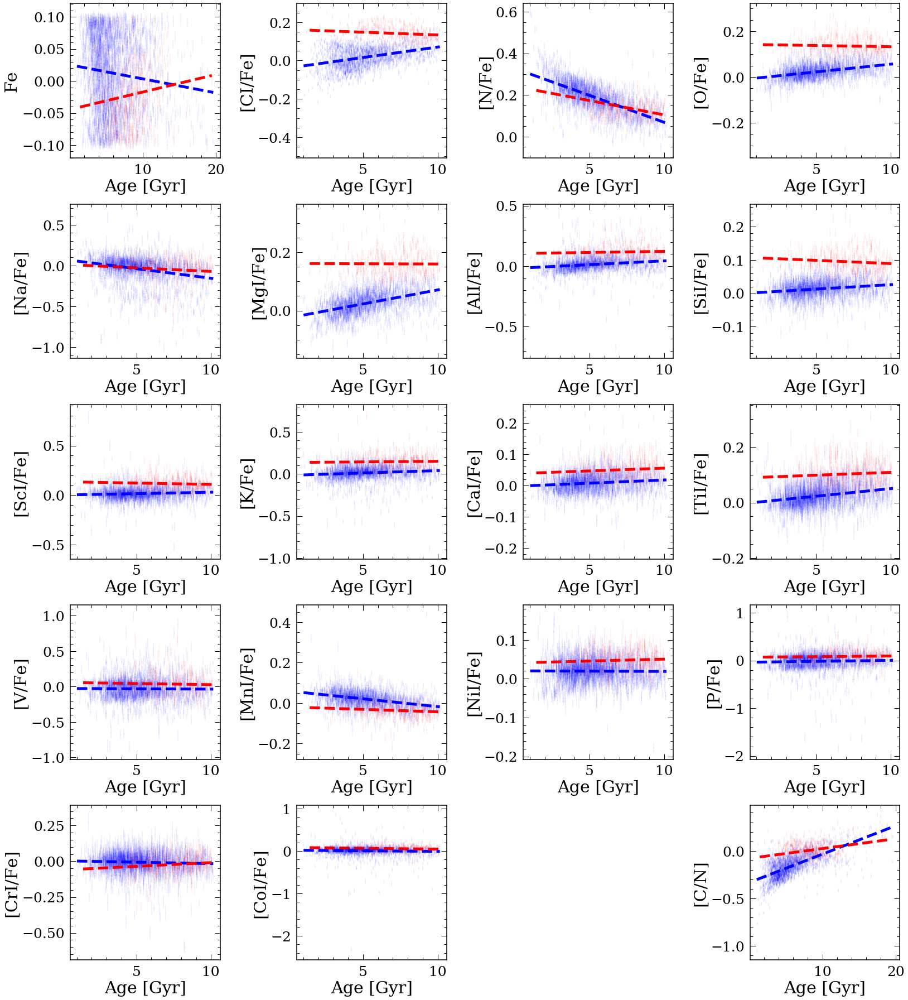

In [116]:
grad_la, grad_la_err, grad_ha, grad_ha_err, Abunname = getgrad(df_abun_st_ha,df_abun_st_la)

In [117]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
Abunname[-1]='C/N'
df_grad=pd.DataFrame(np.array((Abunname,grad_la, grad_la_err, grad_ha, grad_ha_err)).T,
                     columns=['Abund','la_grad','la_grad_err','ha_grad','ha_grad_err'])
df_grad


,Abund,la_grad,la_grad_err,ha_grad,ha_grad_err
0,CI,0.01090877563225809,0.0001256733378210158,-0.0028990031382420916,0.00030556850948836023
1,N,-0.025861501558676572,0.00019610840062745782,-0.013737362284117458,0.0004997921654691794
2,O,0.006779589429256181,0.00013190981299110858,-0.0010545319002479142,0.0003916753223637506
3,Na,-0.023433382374130698,0.0004641969145786673,-0.008785378844097027,0.0011503919968443913
4,MgI,0.009587387262483702,0.00011794343539927572,-0.00019072807906160905,0.0003567607945594968
5,AlI,0.006246669307678516,0.00023186426327068534,0.00181353835762892,0.0006109173001810585
6,SiI,0.002679640290527422,0.0001431372672007805,-0.0019175475960940013,0.00033517352503706956
7,ScI,0.0028210901889411024,0.00036233777704626794,-0.002702865737800988,0.0009362305819807998
8,K,0.005690636259486488,0.0003745593895982518,0.0014262873037819404,0.0009985710205377347
9,CaI,0.002025554015498175,0.00012812695198529756,0.0017656607848461942,0.0003928818186971662


In [118]:
df_disp_plot=pd.merge(df_disp,df_disp_rc,left_on='Abund',right_on='Abund',how='inner')
df_disp_plot=pd.merge(df_disp_plot,df_disp_all,left_on='Abund',right_on='Abund',how='inner')
for i in df_disp_plot.columns:
    if i!='Abund':
        df_disp_plot[i]=[float(j) for j in df_disp_plot[i]]
#df_disp_plot.to_pickle('intrinsic.pkl')
df_disp_plot['Abund'].iloc[18]='C/N'
df_disp_plot=pd.merge(df_disp_plot,df_grad,left_on='Abund',right_on='Abund',how='inner')
df_disp_plot['la_grad']=[float(i) for i in df_disp_plot['la_grad']]
df_disp_plot['la_grad_err']=[float(i) for i in df_disp_plot['la_grad_err']]
df_disp_plot['ha_grad']=[float(i) for i in df_disp_plot['ha_grad']]
df_disp_plot['ha_grad_err']=[float(i) for i in df_disp_plot['ha_grad_err']]

/Users/lucy/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [122]:
#df_disp_plot.to_pickle('intrinsic.pkl')
df_disp_plot['diff']=abs(df_disp_plot['la_grad']-df_disp_plot['ha_grad'])

In [120]:
df_disp_plot=df_disp_plot.sort_values(by='diff',ascending=False)

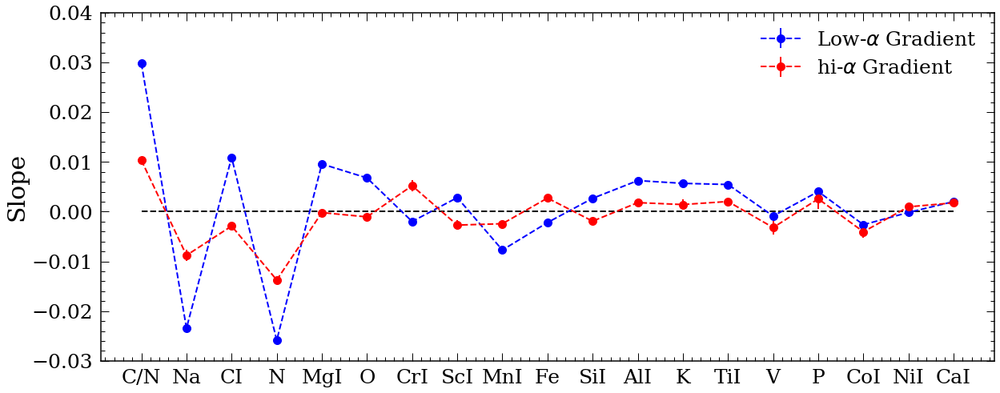

In [121]:
plt.figure(figsize=(20,8))
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['la_grad'],yerr=df_disp_plot['la_grad_err'],
             fmt='bo--',label='Low-$\\alpha$ Gradient',markersize=10)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['ha_grad'],yerr=df_disp_plot['ha_grad_err'],
             fmt='ro--',label='hi-$\\alpha$ Gradient',markersize=10)
plt.plot(df_disp_plot['Abund'],np.zeros(len(df_disp_plot['Abund'])),'k--')

plt.ylim([-0.03,0.04])
plt.ylabel('Slope')
plt.legend()
plt.savefig('slopes.png')

# Check flags.... 
Most stars on the left side clumps are stars with temp. outside of training set. 

before cutting: 245497


"\n# After cutting\ndf=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]\ndf=df.loc[df['TEFF']<5200]\n\n\nplt.subplot(1,2,2)\nplt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')\nplt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')\nplt.xlim([-1.2,0.8])\nplt.ylim([-0.4,0.5])\nplt.title('After cut',fontsize=25)\nplt.legend()\n\nprint('after cutting:',len(df))\n\n"

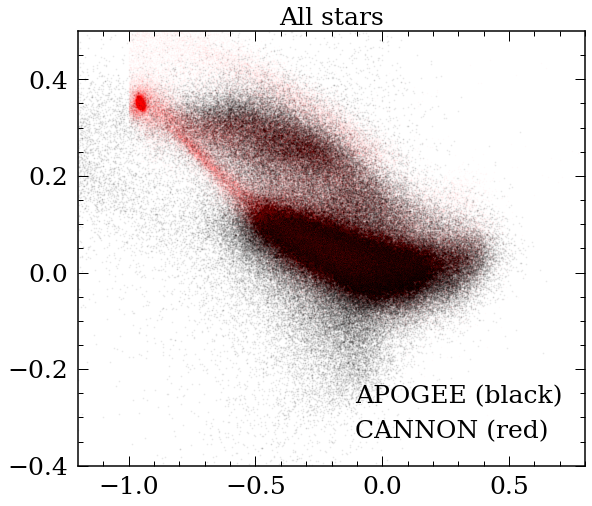

In [55]:
df=pd.read_pickle('CannonDR16.pkl')
print('before cutting:',len(df))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('All stars',fontsize=25)
plt.legend()

"""
# After cutting
df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
df=df.loc[df['TEFF']<5200]


plt.subplot(1,2,2)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('After cut',fontsize=25)
plt.legend()

print('after cutting:',len(df))

"""


In [218]:
df_check=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])>0.2]

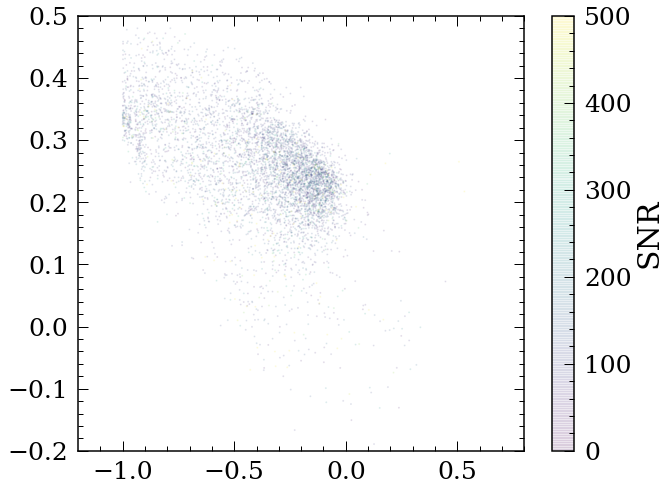

In [219]:
plt.figure(figsize=(10,8))
plt.scatter(df_check['[Fe/H]'],df_check['[Mg/Fe]'],c=df_check['SNR'],s=1,label='APOGEE (black)',vmin=0,vmax=500,alpha=0.1)
plt.xlim([-1.2,0.8])
plt.ylim([-0.2,0.5])
cb=plt.colorbar()
cb.set_label('SNR')

In [222]:
starflag=np.zeros(len(df_check))
starflags=[]
count=0
for i in df_check['STARFLAG'].unique():
    m=df_check['STARFLAG']==i
    starflag[m]=count
    starflags.append(df_check[m]['STARFLAGS'].iloc[0])
    count=count+1
df_check['STARFLAG_color']=starflag


  

In [ ]:
for i in df_check['STARFLAG_color'].unique():
    df_check2=df_check.loc[df_check['STARFLAG_color']==i]
    plt.figure()
    plt.scatter(df_check2['[Fe/H]'],df_check2['[Mg/Fe]'],c='k',s=1,label='APOGEE (black)',alpha=0.1)
    plt.xlim([-1.2,0.8])
    plt.ylim([-0.2,0.5])
    plt.title(str(i))
    

In [229]:
sus=[4,5,8,12,13,15]
starnumb=[]
flags=[]
for i in sus:
    df_check2=df_check.loc[df_check['STARFLAG_color']==i]
    for j in starflags[i].split(','):
        flags.append(j)
    starnumb.append(len(df_check2))
    print(starflags[i],len(df_check2))

 2484
SUSPECT_BROAD_LINES 331
PERSIST_LOW 551
BRIGHT_NEIGHBOR 570
PERSIST_HIGH 309
BRIGHT_NEIGHBOR,PERSIST_LOW 163


In [227]:
import collections
c = collections.Counter()
c.update(flags)

In [228]:
print(c.most_common())

[('PERSIST_LOW', 2), ('BRIGHT_NEIGHBOR', 2), ('', 1), ('SUSPECT_BROAD_LINES', 1), ('PERSIST_HIGH', 1)]
